In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from macrohet import visualise, colours
from tqdm.auto import tqdm
import os
import warnings
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import gridspec
from tqdm import tqdm
import os
from PIL import Image
plt.rcParams['font.family'] = 'Nimbus Sans'
plt.rcParams['font.size'] = 14
visualise.set_plotting_defaults()
expanded_piyg = colours.expanded_piyg
# Conversion factor
meters_per_pixel = 1.4949402023919043E-07  # Micrometers per pixel
micrometers_per_pixel = meters_per_pixel*1E6 # Micrometers per pixel

Helvetica not found. Using Nimbus Sans font.
Default plotting aesthetic loaded.


In [2]:
def replace_ytick_labels(ax, old_label, new_label):
    """
    Replace y-axis tick labels in a given matplotlib Axes object.
    
    Parameters:
    ax (matplotlib.axes.Axes): The axes on which to replace y-tick labels.
    old_label (str): The label to be replaced.
    new_label (str): The new label to replace the old label with.
    """
    # Get current y-tick labels
    yticks = ax.get_yticks()
    yticklabels = [label.get_text() for label in ax.get_yticklabels()]

    # Replace the old label with the new label
    yticklabels = [new_label if label == old_label else label for label in yticklabels]

    # Set the new y-tick labels
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels)

In [3]:
df = pd.read_pickle('/mnt/SYNO/macrohet_syno/results/dfs/sc_df_partialND4.pkl')


In [5]:
for expt_ID in ['PS0000', 'ND0002', 'ND0003', 'ND0004']:
    print(expt_ID, len((df[(df['r2'] >= 0.7) & (df['Experiment ID'] == expt_ID)].drop_duplicates('ID'))))

PS0000 2466
ND0002 881
ND0003 2986
ND0004 213


In [18]:
# Input figure size in millimeters
width_mm = 280  # for example, 180 mm
height_mm = 100  # for example, 80 mm

# Convert millimeters to inches (1 inch = 25.4 mm)
width_in = width_mm / 25.4
height_in = height_mm / 25.4

In [7]:
output_dir = '/mnt/SYNO/macrohet_syno/results/manuscript/f2/' #/mnt/DATA/macrohet/results/preliminary_sc_measures/cumulative_sc_plots/thresholded_480/'#'/Users/dayn/data/macrohet_mac/temp_results/'#
os.makedirs(output_dir, exist_ok = True)

# strip plot

In [9]:
# Prepare the subset DataFrame as before
subset_df = df[(df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['Strain'] != 'UNI')
             & (df['Compound'] == 'CTRL')
             & (df['mtb_origin'] != 'Junk')
               ].drop_duplicates(subset=['ID'])
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] >= 0]
Ncell = len(subset_df.drop_duplicates('ID'))
print(f'N(dt)={len(subset_df)}, N(cell)={Ncell}')

N(dt)=1131, N(cell)=514


/tmp/ipykernel_108458/1717620818.py:14: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_108458/1717620818.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()  # Count occurrences per strain and category


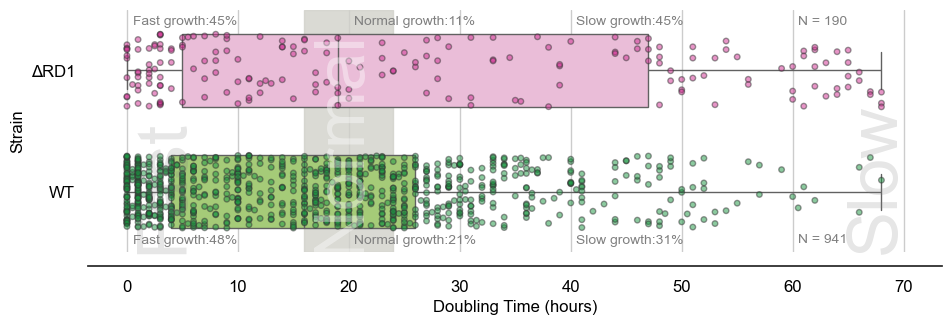

In [22]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 16, 24, float('inf')]  # Define the bins: <20, 20-24, >24
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Plot the boxplot and stripplot (same as before)
f, ax = plt.subplots(figsize=(width_in, height_in/1.25))

sns.boxplot(
    data=subset_df, x="Doubling Times", y="Strain", hue="Strain", 
    whis=[0, 100], width=.6, palette=[expanded_piyg[1], expanded_piyg[-2]]
)

sns.stripplot(
    data=subset_df, x="Doubling Times", y="Strain", size=4, hue="Strain", 
    palette=[expanded_piyg[0], expanded_piyg[-1]], alpha=0.5,
    edgecolor='gray', linewidth=1, jitter=0.3,
)


# Step 4: Calculate and add count and percentage labels for each strain in each growth category
total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()  # Count occurrences per strain and category
strain_totals = subset_df['Strain'].value_counts()  # Total counts per strain


for strain in subset_df['Strain'].unique():
    for category in labels:
        # Get the count for the current strain and category
        count = total_counts.get((strain, category), 0)
        # Calculate the percentage for this strain in this category
        percentage = (count / strain_totals[strain]) * 100
        # Add the count and percentage label on the plot
        ax.text(
            0.5 + labels.index(category)*20 , (-0.4 if strain == 'WT' else 1.4), # Adjust position based on strain
            f"{category} growth:{percentage:.0f}%", 
            color="gray", fontsize=10, va='center', ha='left'
        )

    ax.text(
            0.5 + (labels.index(category)+1)*20 , (-0.4 if strain == 'WT' else 1.4), # Adjust position based on strain
            f"N = {strain_totals[strain]}", 
            color="gray", fontsize=10, va='center', ha='left'
            )

# Step 5: Adjust y-limits to bring boxplots closer together
ax.set_ylim(-0.5, 1.5)  # Compresses the space between the two strains

# Add shaded regions for each growth category
ax.axvspan(0, bins[1], color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(bins[1], bins[2], color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(bins[2], 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 6: Add vertical text labels within each category region
ax.text(bins[0] + 0.5, -0.4, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(bins[1] + 0.5, -0.4, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70 + 0.5, -0.4, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)


replace_ytick_labels(ax, old_label='RD1', new_label='ΔRD1')

# Final tweaks
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

plt.xlabel('Doubling Time (hours)')
# Save the figure
plt.savefig(os.path.join(output_dir, 'wt_rd1_dt_unfiltered_growth_cats.pdf'), bbox_inches='tight',  dpi=314)
plt.show()


/tmp/ipykernel_108458/1939755063.py:14: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_108458/1939755063.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()


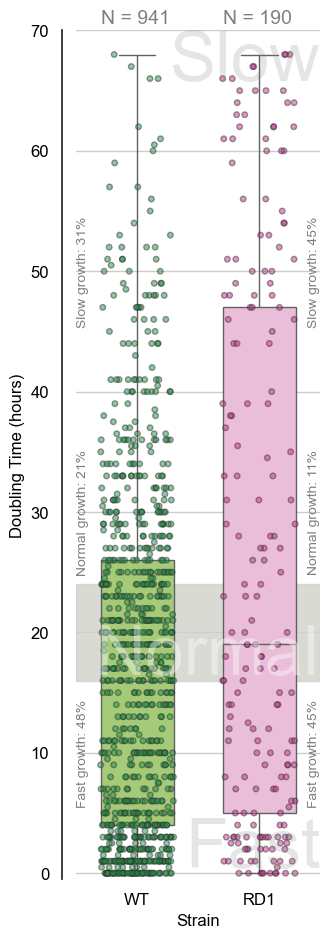

In [52]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 16, 24, float('inf')]  # Define the bins: <20, 20-24, >24
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Plot the boxplot and stripplot with switched orientation
f, ax = plt.subplots(figsize=(height_in / 1.25, width_in))

sns.boxplot(
    data=subset_df, y="Doubling Times", x="Strain", hue="Strain",
    whis=[0, 100], width=0.6, palette=[expanded_piyg[1], expanded_piyg[-2]]
)

sns.stripplot(
    data=subset_df, y="Doubling Times", x="Strain", size=4, hue="Strain",
    palette=[expanded_piyg[0], expanded_piyg[-1]], alpha=0.5,
    edgecolor='gray', linewidth=1, jitter=0.3,
)

# Step 4: Calculate and add count and percentage labels for each strain in each growth category
total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()
strain_totals = subset_df['Strain'].value_counts()

for strain in subset_df['Strain'].unique():
    for category in labels:
        # Get the count for the current strain and category
        count = total_counts.get((strain, category), 0)
        # Calculate the percentage for this strain in this category
        percentage = (count / strain_totals[strain]) * 100
        # Add the count and percentage label on the plot
        ax.text(
            (-0.5 if strain == 'WT' else 1.4), 10 + labels.index(category) * 20,  # Adjust position based on strain
            f"{category} growth: {percentage:.0f}%",
            color="gray", fontsize=10, va='center', ha='left', rotation = 90
        )

    # Add total count for each strain
    ax.text(
        (-0.3 if strain == 'WT' else 0.7), 11+(labels.index(category) + 1) * 20,  # Adjust position based on strain
        f"N = {strain_totals[strain]}",
        color="gray", fontsize=14, va='center', ha='left',
    )


# Step 5: Adjust x-limits to bring boxplots closer together
ax.set_xlim(-0.5, 1.5)
ax.set_ylim(-0.5, 70)
ax.set_yticks([0, 10, 20, 30, 40, 50, 60, 70])

# Add shaded regions for each growth category
ax.axhspan(0, bins[1], color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axhspan(bins[1], bins[2], color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axhspan(bins[2], 70, color=expanded_piyg[3], alpha=0, label='Slow (>28h)')

# Step 6: Add horizontal text labels within each category region
ax.text(1.5, bins[0] + 0.5, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=0)
ax.text(1.5, bins[1] + 0.5, 'Normal', fontsize=50, color='white', alpha=0.4, ha='right', va='baseline', rotation=0)
ax.text(1.5, 70, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='top', rotation=0)

# Replace y-axis labels for strains if necessary
replace_ytick_labels(ax, old_label='RD1', new_label='ΔRD1')

# Final tweaks
ax.yaxis.grid(True)
sns.despine(offset=10, bottom=True)

plt.ylabel('Doubling Time (hours)')
# Save the figure
plt.savefig(os.path.join(output_dir, 'wt_rd1_dt_unfiltered_growth_cats_switched.pdf'), bbox_inches='tight', dpi=314)
plt.show()


### filtered with percentages

In [115]:
# Prepare the subset DataFrame as before
subset_df = df[(df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['Strain'] != 'UNI') 
             & (df['Compound'] == 'CTRL')
             & (df['mtb_origin'] == 'Growth') # are we really doing this right now? or after figure 3? 
               ].drop_duplicates(subset=['ID'])
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=462


/tmp/ipykernel_711288/2888798547.py:14: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_711288/2888798547.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()  # Count occurrences per strain and category


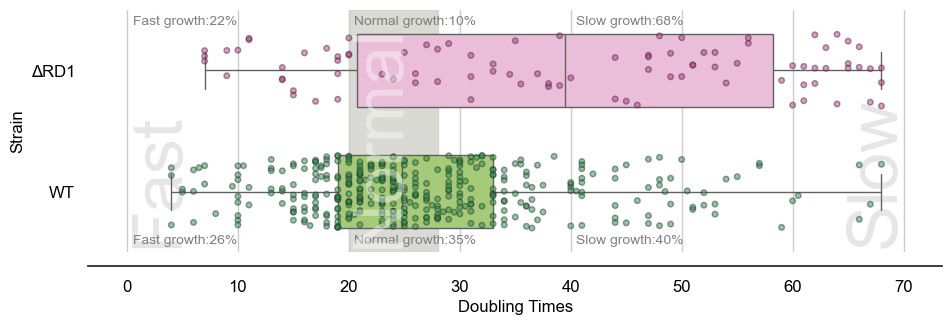

In [121]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-24, >24
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Plot the boxplot and stripplot (same as before)
f, ax = plt.subplots(figsize=(width_in, height_in/1.25))

sns.boxplot(
    data=subset_df, x="Doubling Times", y="Strain", hue="Strain", 
    whis=[0, 100], width=.6, palette=[expanded_piyg[1], expanded_piyg[-2]]
)

sns.stripplot(
    data=subset_df, x="Doubling Times", y="Strain", size=4, hue="Strain", 
    palette=[expanded_piyg[0], expanded_piyg[-1]], alpha=0.5,
    edgecolor='gray', linewidth=1, jitter=0.3,
)


# Step 4: Calculate and add count and percentage labels for each strain in each growth category
total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()  # Count occurrences per strain and category
strain_totals = subset_df['Strain'].value_counts()  # Total counts per strain

for category in labels:
    for strain in subset_df['Strain'].unique():
        # Get the count for the current strain and category
        count = total_counts.get((strain, category), 0)
        # Calculate the percentage for this strain in this category
        percentage = (count / strain_totals[strain]) * 100
        # Add the count and percentage label on the plot
        ax.text(
            0.5 + labels.index(category)*20 , (-0.4 if strain == 'WT' else 1.4), # Adjust position based on strain
            f"{category} growth:{percentage:.0f}%", 
            color="gray", fontsize=10, va='center', ha='left'
        )

# Step 5: Adjust y-limits to bring boxplots closer together
ax.set_ylim(-0.5, 1.5)  # Compresses the space between the two strains

replace_ytick_labels(ax, old_label='RD1', new_label='ΔRD1')

# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 6: Add vertical text labels within each category region
ax.text(0, -0.35, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(20, -0.35, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70.5, -0.35, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)

# Final tweaks
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Save the figure
plt.savefig(os.path.join(output_dir, 'growth_wt_rd1_boxplot_stripplot_doubling_times_with_bins.pdf'), bbox_inches='tight', dpi=314)
plt.show()


In [123]:
# Prepare the subset DataFrame as before
subset_df = df[(df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['Strain'] != 'UNI') 
             & (df['Compound'] == 'CTRL')
             # & ~(df['mtb_origin'].isna()) # are we really doing this right now? or after figure 3? 
               ].drop_duplicates(subset=['ID'])
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=1222


In [124]:
subset_df['mtb_origin'].unique()

array(['Growth', 'Uptake', 'Transfer', 'Junk', 'Unknown'], dtype=object)

/tmp/ipykernel_711288/2037651401.py:26: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_711288/2037651401.py:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_counts = subset_df.groupby(['Growth', 'Growth Category']).size()  # Count occurrences per strain and category


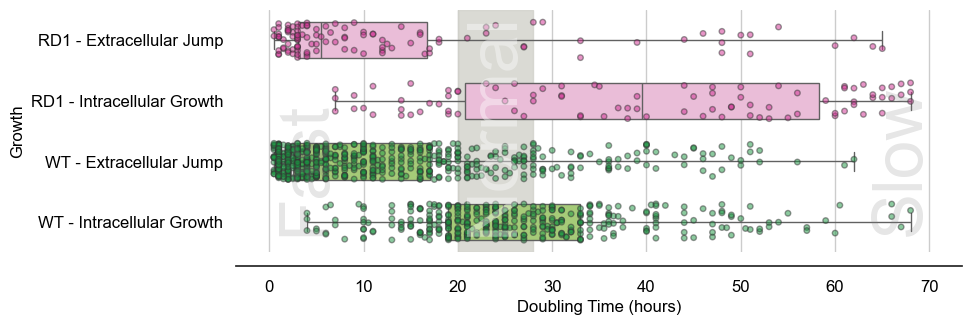

In [145]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-24, >24
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)


# Define the desired order of categories
order = ['RD1 - Extracellular Jump', 'RD1 - Intracellular Growth', 
         'WT - Extracellular Jump', 'WT - Intracellular Growth']

# Update y-axis to reflect segregation by mrb_origin
subset_df['Growth'] = subset_df.apply(
    lambda row: f"{row['Strain']} - Intracellular Growth" if row['mtb_origin'] == 'Growth' 
                else f"{row['Strain']} - Extracellular Jump", axis=1
)

# Step 2: Plot the boxplot and stripplot (same as before)
width_in = 238 / 25.4  # Convert 238 mm to inches
f, ax = plt.subplots(figsize=(width_in, height_in / 1.25))

sns.boxplot(
    data=subset_df, x="Doubling Times", y="Growth", hue="Strain", 
    whis=[0, 100], width=.6, palette=[expanded_piyg[1], expanded_piyg[-2]], order = order
)

sns.stripplot(
    data=subset_df, x="Doubling Times", y="Growth", size=4, hue="Strain", 
    palette=[expanded_piyg[0], expanded_piyg[-1]], alpha=0.5, order = order, 
    edgecolor='gray', linewidth=1, jitter=0.3,
)


# Step 4: Calculate and add count and percentage labels for each strain in each growth category
total_counts = subset_df.groupby(['Growth', 'Growth Category']).size()  # Count occurrences per strain and category
strain_totals = subset_df['Growth'].value_counts()  # Total counts per strain


# for strain in subset_df['Growth'].unique():
#     for category in labels:
#         # Get the count for the current strain and category
#         count = total_counts.get((strain.split(' - ')[0], category), 0)
#         # Calculate the percentage for this strain in this category
#         percentage = (count / strain_totals[strain.split(' - ')[0]]) * 100
#         # Add the count and percentage label on the plot
#         ax.text(
#             0.5 + labels.index(category) * 20,  # x position
#             (-0.4 if 'Intracellular' in strain else 1.4),  # Adjust y position based on strain type
#             f"{category} growth: {percentage:.0f}%", 
#             color="gray", fontsize=10, va='center', ha='left'
#         )

#     # Add the total count label for the strain after all categories
#     ax.text(
#         0.5 + (labels.index(category) + 1) * 20,  # Adjust x position after the last category
#         (-0.4 if 'Intracellular' in strain else 1.4),  # Adjust y position based on strain type
#         f"N = {strain_totals[strain.split(' - ')[0]]}", 
#         color="gray", fontsize=10, va='center', ha='left'
#     )


# # Step 5: Adjust y-limits to bring boxplots closer together
# ax.set_ylim(-0.5, 1.5)  # Compresses the space between the two strains

# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 6: Add vertical text labels within each category region
ax.text(0.5, 3, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(20.5, 3, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70.5, 3, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)


replace_ytick_labels(ax, old_label='RD1', new_label='ΔRD1')

# Final tweaks
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)
plt.legend().remove()
plt.xlabel('Doubling Time (hours)')
# Save the figure
plt.savefig('/mnt/SYNO/macrohet_syno/results/manuscript/f3/wt_rd1_dt_filtered_growth_cats.pdf', bbox_inches='tight',  dpi=314)
plt.show()


/tmp/ipykernel_711288/632156852.py:30: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(


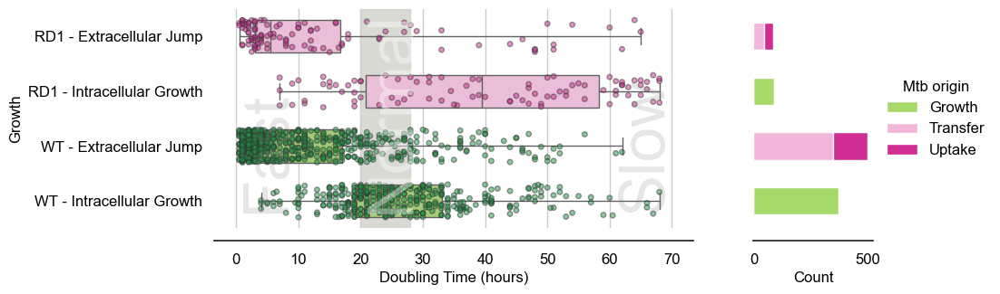

In [161]:
import matplotlib.gridspec as gridspec

# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-24, >24
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Define the desired order of categories
order = ['RD1 - Extracellular Jump', 'RD1 - Intracellular Growth', 
         'WT - Extracellular Jump', 'WT - Intracellular Growth']

# Update y-axis to reflect segregation by mrb_origin
subset_df['Growth'] = subset_df.apply(
    lambda row: f"{row['Strain']} - Intracellular Growth" if row['mtb_origin'] == 'Growth' 
                else f"{row['Strain']} - Extracellular Jump", axis=1
)

# Create figure and gridspec layout for side-by-side plots
fig = plt.figure(figsize=(width_in, height_in / 1.25))
gs = gridspec.GridSpec(1, 2, width_ratios=[4, 1])  # Wider boxplot on the left, narrower bar chart on the right

# Step 2: Plot the boxplot and stripplot
ax1 = plt.subplot(gs[0])  # First subplot for boxplot and stripplot

sns.boxplot(
    data=subset_df, x="Doubling Times", y="Growth", hue="Strain", 
    whis=[0, 100], width=.6, palette=[expanded_piyg[1], expanded_piyg[-2]], order=order, ax=ax1
)

sns.stripplot(
    data=subset_df, x="Doubling Times", y="Growth", size=4, hue="Strain", 
    palette=[expanded_piyg[0], expanded_piyg[-1]], alpha=0.5, order=order, 
    edgecolor='gray', linewidth=1, jitter=0.3, ax=ax1
)

# Add shaded regions for each growth category
ax1.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax1.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax1.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Add vertical text labels within each category region
ax1.text(0.5, 3, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax1.text(20.5, 3, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax1.text(70.5, 3, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)

replace_ytick_labels(ax1, old_label='RD1', new_label='ΔRD1')

# Final tweaks for the first plot
ax1.xaxis.grid(True)
sns.despine(offset=10, left=True)
plt.legend().remove()
ax1.set_xlabel('Doubling Time (hours)')

# Step 3: Plot the bar chart
ax2 = plt.subplot(gs[1])  # Second subplot for bar chart

# Calculate the distribution of mtb_origin for each Growth category
origin_counts = subset_df.groupby(['Growth', 'mtb_origin']).size().unstack(fill_value=0)
del origin_counts['Junk']
del origin_counts['Unknown']
# Plot the bar chart, aligning y-axis with the boxplot
origin_counts = origin_counts.reindex(reversed(order))  # Ensure the same y-order as boxplot
origin_counts.plot(kind='barh', stacked=True, ax=ax2, color=[expanded_piyg[1], expanded_piyg[-2],  expanded_piyg[-1]])

# Final tweaks for the second plot
ax2.set_xlabel('Count')
ax2.set_ylabel('')  # Remove y-axis label
ax2.set_yticklabels([])  # Remove y-tick labels for the bar chart
sns.despine(offset=10, left=True)

# Place the legend outside the plot, to the right
ax2.legend(title='Mtb origin', loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)

# Save the figure
plt.savefig('/mnt/SYNO/macrohet_syno/results/manuscript/f3/wt_rd1_dt_filtered_growth_cats_with_bar.pdf', bbox_inches='tight', dpi=314)
plt.show()


In [160]:
origin_counts

mtb_origin,Growth,Transfer,Uptake
Growth,,,
RD1 - Extracellular Jump,0,47,40
RD1 - Intracellular Growth,90,0,0
WT - Extracellular Jump,0,347,153
WT - Intracellular Growth,372,0,0


/tmp/ipykernel_711288/2231919966.py:32: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_711288/2231919966.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()  # Count occurrences per strain and category


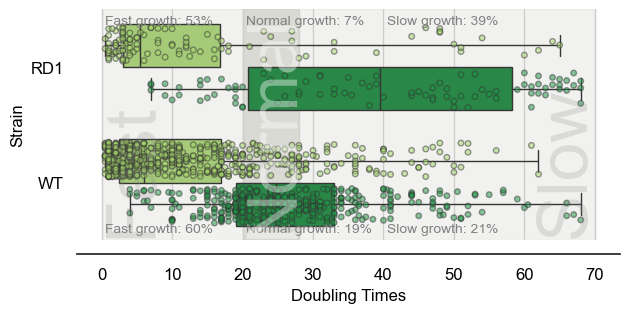

In [111]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Update y-axis to reflect segregation by mtb_origin
subset_df['Growth'] = subset_df.apply(
    lambda row: "Intracellular Growth" if row['mtb_origin'] == 'Growth' 
                else "Extracellular Jump", axis=1
)

# Step 2: Plot the boxplot and stripplot
f, ax = plt.subplots(figsize=(7, 3))

# Define colors for WT and RD1 strains using expanded_piyg[-2] and expanded_piyg[-1]
strain_palette = {
    'WT': expanded_piyg[-2],  # Color for WT
    'RD1': expanded_piyg[-1]  # Color for RD1
}

# Use Growth to further differentiate based on mtb_origin, controlling hue
growth_palette = [expanded_piyg[0], expanded_piyg[1]]  # Colors for growth

# Plot boxplot with strain color and hue separation for Growth
sns.boxplot(
    data=subset_df, x="Doubling Times", y="Strain", hue="Growth",
    whis=[0, 100], width=.75, palette=growth_palette, ax=ax, hue_order=['Intracellular Growth', 'Extracellular Jump'],
    dodge=True
)

# Add the stripplot for individual data points, using the same separation by Growth and strain color
sns.stripplot(
    data=subset_df, x="Doubling Times", y="Strain", hue="Growth", size=4,
    edgecolor='gray', linewidth=1, jitter=0.3,
    palette=growth_palette, dodge=True, alpha=0.5, ax=ax, hue_order=['Intracellular Growth', 'Extracellular Jump']
)

# Step 3: Manually set strain colors
for patch, artist in zip(ax.patches, ax.artists):
    # Assign the correct strain color to each box plot
    if 'WT' in artist.get_label():
        patch.set_facecolor(strain_palette['WT'])
    else:
        patch.set_facecolor(strain_palette['RD1'])

# Step 4: Turn off the legend
ax.legend_.remove()

# Step 5: Calculate and add count and percentage labels for each strain in each growth category
total_counts = subset_df.groupby(['Strain', 'Growth Category']).size()  # Count occurrences per strain and category
strain_totals = subset_df['Strain'].value_counts()  # Total counts per strain

for category in labels:
    for strain in subset_df['Strain'].unique():
        # Get the count for the current strain and category
        count = total_counts.get((strain, category), 0)
        # Calculate the percentage for this strain in this category
        percentage = (count / strain_totals[strain]) * 100
        # Add the count and percentage label on the plot
        ax.text(
            0.5 + labels.index(category) * 20, (-0.4 if strain == 'WT' else 1.4),  # Adjust position based on strain
            f"{category} growth: {percentage:.0f}%", 
            color="gray", fontsize=10, va='center', ha='left'
        )

# Step 6: Adjust y-limits to bring boxplots closer together
ax.set_ylim(-0.5, 1.5)  # Compresses the space between the two strains

# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0.3, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0.3, label='Slow (>28h)')

# Step 7: Add vertical text labels within each category region
ax.text(0, -0.35, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(20, -0.35, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70.5, -0.35, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)

# Final tweaks
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Save the figure
# plt.savefig(os.path.join(output_dir, 'boxplot_stripplot_doubling_times_with_bins.pdf'), dpi=314)
plt.show()


/tmp/ipykernel_711288/1417956514.py:52: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_711288/1417956514.py:99: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_counts = subset_df.groupby(['Y Axis Label', 'Concentration', 'Growth Category', 'Strain']).size()
/tmp/ipykernel_711288/1417956514.py:169: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


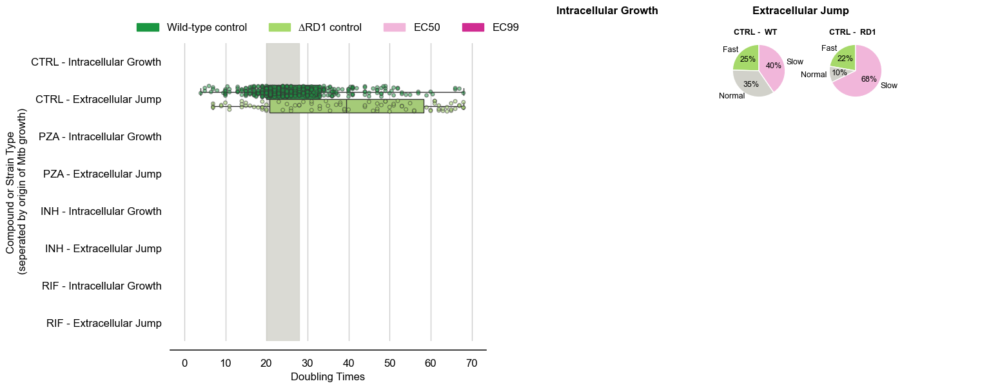

In [83]:
# Define the desired order with CTRL at the top
strain_order = ['CTRL', 'PZA', 'INH', 'RIF']


subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: 'CTRL' if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Create a new column to differentiate WT and RD1 under the CTRL group
subset_df['CTRL Type'] = subset_df.apply(
    lambda row: row['Strain'] if row['Compound'] == 'CTRL' else None, axis=1
)

# Update y-axis to reflect segregation by mrb_origin
subset_df['Y Axis Label'] = subset_df.apply(
    lambda row: f"{row['Mtb Strain or Drug Compound']} - Intracellular Growth" if row['mtb_origin'] == 'Growth' 
                else f"{row['Mtb Strain or Drug Compound']} - Extracellular Jump", axis=1
)

# Define the new order to reflect both conditions (Growth vs. Non-Growth)
strain_order_with_origin = [
    f'CTRL - Intracellular Growth', f'CTRL - Extracellular Jump', 
    f'PZA - Intracellular Growth', f'PZA - Extracellular Jump', 
    f'INH - Intracellular Growth', f'INH - Extracellular Jump', 
    f'RIF - Intracellular Growth', f'RIF - Extracellular Jump'
]
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section


# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = subset['Concentration'].unique()

    if compound == 'CTRL':
        # Plot CTRL with WT and RD1 differentiated by hue and mtb_origin
        sns.boxplot(
            data=subset, x="Doubling Times", y="Y Axis Label", hue="CTRL Type",
            whis=[0, 100], width=.75, palette=[expanded_piyg[0], expanded_piyg[1]], ax=ax, order=strain_order_with_origin
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Y Axis Label", hue="CTRL Type", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, ax=ax, order=strain_order_with_origin
        )

    else:
        # Determine the colors based on the compound and available concentrations
        palette = [expanded_piyg[4] if concentration == 'EC50' else expanded_piyg[5] for concentration in available_concentrations]

        # Plot boxplot and stripplot only for existing concentrations of the compound
        sns.boxplot(
            data=subset, x="Doubling Times", y="Y Axis Label", hue="Concentration",
            whis=[0, 100], width=.75, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order_with_origin
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Y Axis Label", hue="Concentration", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=palette, hue_order=available_concentrations, dodge=True, alpha=0.5, ax=ax, order=strain_order_with_origin
        )

# Manually create legend handles for each concentration level
legend_handles = [
    mpatches.Patch(color=expanded_piyg[0], label='Wild-type control'),      # Color for WT CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[1], label='∆RD1 control'),      # Color for RD1 CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[4], label='EC50'),                # Common color for EC50
    mpatches.Patch(color=expanded_piyg[5], label='EC99')                 # Common color for EC99
]

# Add the legend directly above the box plot
ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4, frameon=False)
ax.set_ylabel('Compound or Strain Type\n (seperated by origin of Mtb growth)')

# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 5: Pie Charts (right side)
# Define the explicit compound order with CTRL compounds at the top
compound_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category (with mtb_origin segregation)
grouped_counts = subset_df.groupby(['Y Axis Label', 'Concentration', 'Growth Category', 'Strain']).size()

pi_x_start_pos = 0.8  # Starting x-position for pie charts
pi_y_start_pos = 0.75  # Adjusted starting y-position to shift pie charts up
y_gap = 0.11

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]]  # Colors for Fast, Normal, Slow growth

# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(strain_order_with_origin):
    for j, concentration in enumerate(concentration_order):
        for strain in ['WT', 'RD1']:
            fast_count = grouped_counts.get((compound, concentration, 'Fast', strain), 0)
            normal_count = grouped_counts.get((compound, concentration, 'Normal', strain), 0)
            slow_count = grouped_counts.get((compound, concentration, 'Slow', strain), 0)
    
            # Only plot the pie chart if there are data points for the compound-concentration-mtb_origin combination
            if fast_count + normal_count + slow_count > 0:
                counts = [fast_count, normal_count, slow_count]
                # Filter out zero counts and corresponding labels and colors
                filtered_counts = [count for count in counts if count > 0]
                filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
                filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]
                
                # Adjust x-position for side-by-side pie charts of CTRL (WT and RD1)
                if concentration == 'EC0':
                    x_pos = pi_x_start_pos 
                elif concentration == 'EC50':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC99':
                    x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50
    
                # Adjust y-position for WT (CTRL) and RD1 (CTRL) to ensure they are stacked properly
                y_pos = pi_y_start_pos - (i * y_gap)
                if strain == 'RD1':
                    x_pos = pi_x_start_pos + 0.15
                
                if 'Extracellular Jump' in compound:
                    x_pos += 0.3
                    y_pos = pi_y_start_pos - ((i-1) * y_gap)
                # Create pie chart on the right side of the corresponding compound
                ax_pie = fig.add_axes([x_pos, y_pos, 0.17, 0.17], aspect=1)  # Position for each pie chart
                ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})
                
                # Add a label below each pie chart for the compound, concentration, and mtb_origin type
                compound_label = compound.split(' -')[0]
                concentration_label = concentration if concentration != 'EC0' else ''
                strain_label =  strain if concentration == 'EC0' else ''
                ax_label = fig.add_axes([x_pos+0.03, y_pos + 0.17, 0.1, 0.03])  # Smaller box for the label
                ax_label.text(0.5, 0.5, f'{compound_label} - {concentration_label} {strain_label}', horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
                ax_label.set_axis_off()  # Hide axis for the label

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Shaded region for the two pie chart categories
# Intracellular Growth
ax_pie_background_1 = fig.add_axes([0.75, 0.15, 0.4, 0.8], facecolor=expanded_piyg[4], alpha=0.9)
ax_pie_background_1.set_axis_off()

# Extracellular Jump
ax_pie_background_2 = fig.add_axes([1.15, 0.15, 0.4, 0.8], facecolor=expanded_piyg[1], alpha=0.9)
ax_pie_background_2.set_axis_off()

# Add labels at the top of each shaded region
ax_pie_background_1.text(0.5, 1.05, 'Intracellular Growth', fontsize=12, fontweight='bold', color='black', ha='center', va='center')
ax_pie_background_2.text(0.25, 1.05, 'Extracellular Jump', fontsize=12, fontweight='bold', color='black', ha='center', va='center')

# Show the plot
plt.tight_layout()


### Now with antibiotic conditions

In [53]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             # & (df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['mtb_origin'] == 'Growth')  # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=700


In [54]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             # & (df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             & (df['mtb_origin'] == 'Growth')  # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=700


In [55]:
subset_df['Experiment ID'].unique()

array(['PS0000', 'ND0003', 'ND0002', 'ND0004'], dtype=object)

In [56]:
subset_df[subset_df['Compound'] == 'INH']['Concentration']

4329       EC99
4329       EC99
10654      EC50
35961      EC50
40530      EC50
           ... 
1073021    EC50
1081020    EC50
1081756    EC50
1081756    EC50
1083193    EC50
Name: Concentration, Length: 120, dtype: object

In [58]:
# Define the explicit compound order with CTRL compounds at the top
compound_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']
concentration_order = ['EC0', 'EC50', 'EC99']

/tmp/ipykernel_108458/1011899902.py:49: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_108458/1011899902.py:49: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_108458/1011899902.py:49: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_108458/1011899902.py:49: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_108458/1011899902.py:49: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_108458/1011899902.py:86: FutureWarning: The default of observed=False is deprecated a

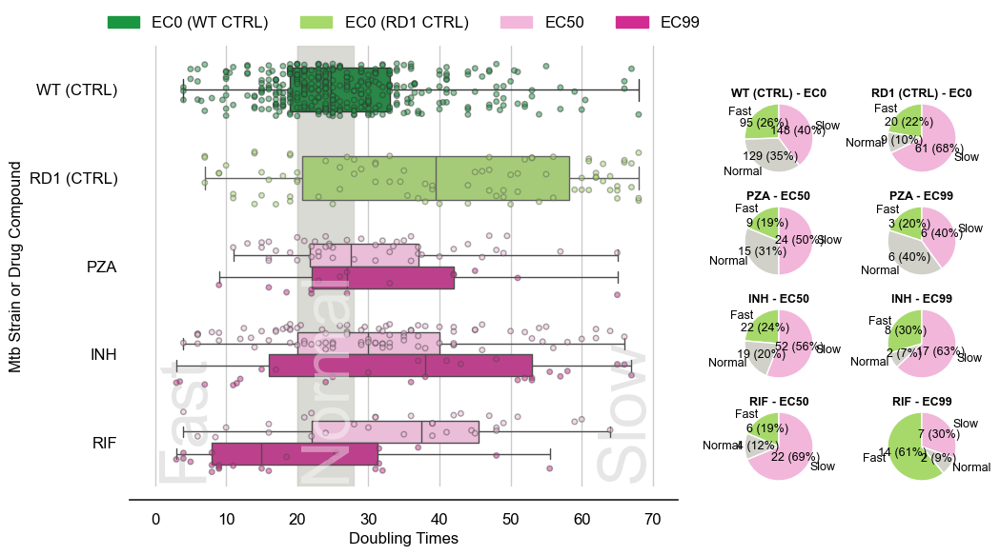

In [66]:
# Define a custom function to display both count (N) and percentage
def format_autopct(pct, all_values):
    absolute = int(round(pct / 100. * np.sum(all_values)))  # Calculate absolute count
    return f"{absolute} ({pct:.0f}%)" if absolute > 0 else ''


# Modify the DataFrame to place both WT and RD1 under the CTRL compound row
subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: f"{row['Strain']} (CTRL)" if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Define the desired order with WT and RD1 at the top
strain_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']

# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = sorted(subset['Concentration'].unique())

    # Determine the colors based on the compound and available concentrations
    if compound == 'WT (CTRL)':
        palette = [expanded_piyg_color_map['CTRL']['wt']]
    elif compound == 'RD1 (CTRL)':
        palette = [expanded_piyg_color_map['CTRL']['rd1']]
    else:
        palette = [expanded_piyg_color_map[compound][concentration] for concentration in available_concentrations]

    # Plot boxplot and stripplot only for existing concentrations of the compound
    sns.boxplot(
        data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
        whis=[0, 100], width=.5, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order
    )

    # Capture legend handles and labels from the boxplot
    box_handles, box_labels = ax.get_legend_handles_labels()

    sns.stripplot(
        data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4,
        edgecolor='gray', linewidth=1, jitter=0.3,
        palette=palette, hue_order=available_concentrations, dodge=True, alpha=0.5, ax=ax, order=strain_order
    )

# Manually create legend handles for each concentration level
legend_handles = [
    mpatches.Patch(color=expanded_piyg[0], label='EC0 (WT CTRL)'),      # Color for WT CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[1], label='EC0 (RD1 CTRL)'),      # Color for RD1 CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[4], label='EC50'),                # Common color for EC50
    mpatches.Patch(color=expanded_piyg[5], label='EC99')                 # Common color for EC99
]

# Add the legend directly above the box plot
ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4, frameon=False)


# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 6: Add vertical text labels within each category region
ax.text(0, 4.3, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(20, 4.3, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70.5, 4.3, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)

# Step 5: Pie Charts (right side)
# Define the explicit compound order with CTRL compounds at the top
compound_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']
concentration_order = ['EC0', 'EC50', 'EC99']

growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.85 # Adjusted starting y-position to shift pie charts up
y_gap = 0.18

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]]#['#7BDAA4', '#FFEDDF', '#D12B82',]
# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    for j, concentration in enumerate(concentration_order):
        # Get the counts for Fast, Normal, and Slow growth for this compound and concentration
        fast_count = grouped_counts.get((compound, concentration, 'Fast'), 0)
        normal_count = grouped_counts.get((compound, concentration, 'Normal'), 0)
        slow_count = grouped_counts.get((compound, concentration, 'Slow'), 0)

        # Only plot the pie chart if there are data points for the compound-concentration combination
        if fast_count + normal_count + slow_count > 0:
            counts = [fast_count, normal_count, slow_count]
            
            # Filter out zero counts and corresponding labels and colors
            filtered_counts = [count for count in counts if count > 0]
            filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
            filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]
            
            # Adjust x-position for side-by-side pie charts of CTRL (WT and RD1)
            if concentration == 'EC0':
                x_pos = pi_x_start_pos 
            elif concentration == 'EC50':
                x_pos = pi_x_start_pos
            elif concentration == 'EC99':
                x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

            # Adjust y-position for WT (CTRL) and RD1 (CTRL) to ensure they are side by side
            if compound == 'WT (CTRL)':
                y_pos = pi_y_start_pos - y_gap
            elif compound == 'RD1 (CTRL)':
                x_pos += 0.15 # Shift RD1 pie chart to the right of WT
                y_pos = pi_y_start_pos - (i * y_gap)
            else:
                y_pos = pi_y_start_pos - (i * y_gap)

            # Create pie chart on the right side of the corresponding compound
            ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
            ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct=lambda pct: format_autopct(pct, filtered_counts), startangle=90, textprops={'fontsize': 9})
            
            # Add a label below each pie chart for the compound and concentration
            ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
            ax_label.text(0.75, 5.75, f'{compound} - {concentration}', horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
            ax_label.set_axis_off()  # Hide axis for the label

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()

plt.savefig('/mnt/SYNO/macrohet_syno/results/manuscript/f4/f4.pdf', bbox_inches = 'tight', dpi = 314)
plt.show()


In [43]:
df[(df['Experiment ID'] == 'ND0004')].drop_duplicates('ID')

,ID,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,...,Time Model (hours),Mtb Area Model (µm),mtb_origin,Doubling Amounts,Doubling Times,r2,level_1,t,Unique_ID,Frame
1092545,1.4.7.ND0004,0.0,NaN,NaN,NaN,NaN,NaN,True,True,70.0,...,NaN,NaN,NaN,None,None,-0.18,0.0,0.0,1.4.7.ND0004,NaN
1092589,10.4.7.ND0004,0.0,0.178788,NaN,959.151296,NaN,NaN,True,True,404.0,...,NaN,NaN,NaN,None,None,0.27,581.0,0.0,10.4.7.ND0004,NaN
1092626,1018.4.7.ND0004,0.0,0.000000,NaN,637.042912,NaN,NaN,False,False,3968.0,...,NaN,NaN,NaN,None,None,0.04,10296.0,0.0,1018.4.7.ND0004,NaN
1092780,10207.4.7.ND0004,30.0,NaN,NaN,NaN,NaN,NaN,False,False,1604.0,...,NaN,NaN,NaN,None,None,-1.14,42636.0,60.0,10207.4.7.ND0004,NaN
1092874,10224.4.7.ND0004,25.5,0.000000,NaN,1411.551214,NaN,NaN,False,False,955.0,...,NaN,NaN,NaN,NaN,NaN,1.0,42730.0,51.0,10224.4.7.ND0004,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1172859,927.4.8.ND0004,0.0,27.645048,NaN,1858.475759,NaN,NaN,True,True,1748.0,...,NaN,NaN,NaN,None,None,0.7,13296.0,0.0,927.4.8.ND0004,0.0
1172944,928.4.8.ND0004,0.0,NaN,NaN,NaN,NaN,NaN,True,True,4480.0,...,NaN,NaN,NaN,None,None,0.66,13381.0,0.0,928.4.8.ND0004,0.0
1173098,953.4.8.ND0004,8.0,7.665522,NaN,2596.198492,NaN,NaN,False,True,3064.0,...,NaN,NaN,NaN,None,None,0.56,13535.0,16.0,953.4.8.ND0004,16.0
1173197,989.4.8.ND0004,38.0,110.848372,NaN,1784.055380,NaN,NaN,True,True,224.0,...,NaN,NaN,NaN,None,None,0.18,13634.0,76.0,989.4.8.ND0004,76.0


In [44]:
df[(df['Experiment ID'] == 'ND0004') & (df['mtb_origin'] == 'Growth')].drop_duplicates('ID')

,ID,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,...,Time Model (hours),Mtb Area Model (µm),mtb_origin,Doubling Amounts,Doubling Times,r2,level_1,t,Unique_ID,Frame
1102102,2073.4.7.ND0004,0.0,26.862851,NaN,598.715299,NaN,NaN,False,True,5682.0,...,NaN,NaN,Growth,"[1.92, 3.84, 7.68, 15.36]","[1.5, 3.0, 4.0]",0.8,17061.0,0.0,2073.4.7.ND0004,NaN
1108844,2747.4.7.ND0004,0.0,11.777640,NaN,466.233616,NaN,NaN,False,True,3545.0,...,NaN,NaN,Growth,"[1.92, 3.84, 7.68]","[3.0, 6.0]",0.95,22206.0,0.0,2747.4.7.ND0004,NaN
1117484,4131.4.7.ND0004,0.0,36.606781,NaN,1223.108982,NaN,NaN,True,True,4225.0,...,NaN,NaN,Growth,"[17.0, 34.0]",[17.0],0.84,28904.0,0.0,4131.4.7.ND0004,NaN
1136373,9711.4.7.ND0004,29.0,NaN,NaN,NaN,NaN,NaN,False,True,1155.0,...,NaN,NaN,Growth,"[1.92, 3.84]",[5.0],0.85,42305.0,58.0,9711.4.7.ND0004,NaN
1137846,1255.4.8.ND0004,0.0,34.327238,NaN,412.195035,NaN,NaN,True,True,1362.0,...,NaN,NaN,Growth,"[4.3, 8.6, 17.2, 34.4]","[18.5, 9.0, 8.0]",0.88,14834.0,0.0,1255.4.8.ND0004,0.0
1142900,1768.4.8.ND0004,27.5,12.649230,NaN,1792.234917,NaN,NaN,True,True,759.0,...,NaN,NaN,Growth,"[5.4, 10.8]",[24.5],0.79,19327.0,55.0,1768.4.8.ND0004,55.0
1145792,2032.4.8.ND0004,0.0,43.557153,NaN,1284.209677,NaN,NaN,True,True,2428.0,...,NaN,NaN,Growth,"[24.2, 48.4]",[25.5],0.74,20694.0,0.0,2032.4.8.ND0004,0.0
1153935,3483.4.8.ND0004,0.0,43.735940,NaN,1792.815977,NaN,NaN,True,True,3195.0,...,NaN,NaN,Growth,"[8.4, 16.8]",[9.0],0.85,26376.0,0.0,3483.4.8.ND0004,0.0
1155201,372.4.8.ND0004,0.0,NaN,NaN,NaN,NaN,NaN,True,True,6009.0,...,NaN,NaN,Growth,"[4.3, 8.6]",[11.0],0.79,7463.0,0.0,372.4.8.ND0004,0.0
1163425,578.4.8.ND0004,0.0,NaN,NaN,NaN,NaN,NaN,False,True,4642.0,...,NaN,NaN,Growth,"[1.92, 3.84]",[5.0],0.83,9710.0,0.0,578.4.8.ND0004,0.0


In [45]:
df[(df['Experiment ID'] == 'ND0004') & (df['mtb_origin'] == 'Growth')].drop_duplicates('ID').explode('Doubling Times')

,ID,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,...,Time Model (hours),Mtb Area Model (µm),mtb_origin,Doubling Amounts,Doubling Times,r2,level_1,t,Unique_ID,Frame
1102102,2073.4.7.ND0004,0.0,26.862851,NaN,598.715299,NaN,NaN,False,True,5682.0,...,NaN,NaN,Growth,"[1.92, 3.84, 7.68, 15.36]",1.5,0.8,17061.0,0.0,2073.4.7.ND0004,NaN
1102102,2073.4.7.ND0004,0.0,26.862851,NaN,598.715299,NaN,NaN,False,True,5682.0,...,NaN,NaN,Growth,"[1.92, 3.84, 7.68, 15.36]",3.0,0.8,17061.0,0.0,2073.4.7.ND0004,NaN
1102102,2073.4.7.ND0004,0.0,26.862851,NaN,598.715299,NaN,NaN,False,True,5682.0,...,NaN,NaN,Growth,"[1.92, 3.84, 7.68, 15.36]",4.0,0.8,17061.0,0.0,2073.4.7.ND0004,NaN
1108844,2747.4.7.ND0004,0.0,11.777640,NaN,466.233616,NaN,NaN,False,True,3545.0,...,NaN,NaN,Growth,"[1.92, 3.84, 7.68]",3.0,0.95,22206.0,0.0,2747.4.7.ND0004,NaN
1108844,2747.4.7.ND0004,0.0,11.777640,NaN,466.233616,NaN,NaN,False,True,3545.0,...,NaN,NaN,Growth,"[1.92, 3.84, 7.68]",6.0,0.95,22206.0,0.0,2747.4.7.ND0004,NaN
1117484,4131.4.7.ND0004,0.0,36.606781,NaN,1223.108982,NaN,NaN,True,True,4225.0,...,NaN,NaN,Growth,"[17.0, 34.0]",17.0,0.84,28904.0,0.0,4131.4.7.ND0004,NaN
1136373,9711.4.7.ND0004,29.0,NaN,NaN,NaN,NaN,NaN,False,True,1155.0,...,NaN,NaN,Growth,"[1.92, 3.84]",5.0,0.85,42305.0,58.0,9711.4.7.ND0004,NaN
1137846,1255.4.8.ND0004,0.0,34.327238,NaN,412.195035,NaN,NaN,True,True,1362.0,...,NaN,NaN,Growth,"[4.3, 8.6, 17.2, 34.4]",18.5,0.88,14834.0,0.0,1255.4.8.ND0004,0.0
1137846,1255.4.8.ND0004,0.0,34.327238,NaN,412.195035,NaN,NaN,True,True,1362.0,...,NaN,NaN,Growth,"[4.3, 8.6, 17.2, 34.4]",9.0,0.88,14834.0,0.0,1255.4.8.ND0004,0.0
1137846,1255.4.8.ND0004,0.0,34.327238,NaN,412.195035,NaN,NaN,True,True,1362.0,...,NaN,NaN,Growth,"[4.3, 8.6, 17.2, 34.4]",8.0,0.88,14834.0,0.0,1255.4.8.ND0004,0.0


#### WithOUT additional ND4

/tmp/ipykernel_1753805/3203584118.py:43: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_1753805/3203584118.py:43: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_1753805/3203584118.py:43: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_1753805/3203584118.py:43: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_1753805/3203584118.py:43: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_1753805/3203584118.py:79: FutureWarning: The default of observed=False is deprec

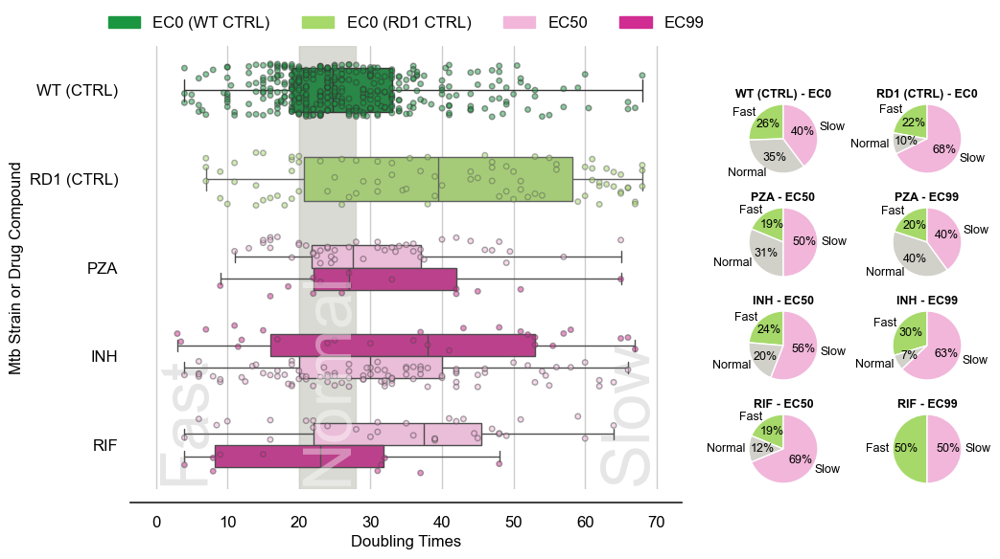

In [15]:
# Modify the DataFrame to place both WT and RD1 under the CTRL compound row
subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: f"{row['Strain']} (CTRL)" if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Define the desired order with WT and RD1 at the top
strain_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']

# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = subset['Concentration'].unique()
    
    # Determine the colors based on the compound and available concentrations
    if compound == 'WT (CTRL)':
        palette = [expanded_piyg_color_map['CTRL']['wt']]
    elif compound == 'RD1 (CTRL)':
        palette = [expanded_piyg_color_map['CTRL']['rd1']]
    else:
        palette = [expanded_piyg_color_map[compound][concentration] for concentration in available_concentrations]

    # Plot boxplot and stripplot only for existing concentrations of the compound
    sns.boxplot(
        data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
        whis=[0, 100], width=.5, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order
    )

    # Capture legend handles and labels from the boxplot
    box_handles, box_labels = ax.get_legend_handles_labels()

    sns.stripplot(
        data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4,
        edgecolor='gray', linewidth=1, jitter=0.3,
        palette=palette, hue_order=available_concentrations, dodge=True, alpha=0.5, ax=ax, order=strain_order
    )

# Manually create legend handles for each concentration level
legend_handles = [
    mpatches.Patch(color=expanded_piyg[0], label='EC0 (WT CTRL)'),      # Color for WT CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[1], label='EC0 (RD1 CTRL)'),      # Color for RD1 CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[4], label='EC50'),                # Common color for EC50
    mpatches.Patch(color=expanded_piyg[5], label='EC99')                 # Common color for EC99
]

# Add the legend directly above the box plot
ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4, frameon=False)


# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 6: Add vertical text labels within each category region
ax.text(0, 4.3, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(20, 4.3, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70.5, 4.3, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)

# Step 5: Pie Charts (right side)
# Define the explicit compound order with CTRL compounds at the top
compound_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.85 # Adjusted starting y-position to shift pie charts up
y_gap = 0.18

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]]#['#7BDAA4', '#FFEDDF', '#D12B82',]
# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    for j, concentration in enumerate(concentration_order):
        # Get the counts for Fast, Normal, and Slow growth for this compound and concentration
        fast_count = grouped_counts.get((compound, concentration, 'Fast'), 0)
        normal_count = grouped_counts.get((compound, concentration, 'Normal'), 0)
        slow_count = grouped_counts.get((compound, concentration, 'Slow'), 0)

        # Only plot the pie chart if there are data points for the compound-concentration combination
        if fast_count + normal_count + slow_count > 0:
            counts = [fast_count, normal_count, slow_count]
            
            # Filter out zero counts and corresponding labels and colors
            filtered_counts = [count for count in counts if count > 0]
            filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
            filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]
            
            # Adjust x-position for side-by-side pie charts of CTRL (WT and RD1)
            if concentration == 'EC0':
                x_pos = pi_x_start_pos 
            elif concentration == 'EC50':
                x_pos = pi_x_start_pos
            elif concentration == 'EC99':
                x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

            # Adjust y-position for WT (CTRL) and RD1 (CTRL) to ensure they are side by side
            if compound == 'WT (CTRL)':
                y_pos = pi_y_start_pos - y_gap
            elif compound == 'RD1 (CTRL)':
                x_pos += 0.15 # Shift RD1 pie chart to the right of WT
                y_pos = pi_y_start_pos - (i * y_gap)
            else:
                y_pos = pi_y_start_pos - (i * y_gap)

            # Create pie chart on the right side of the corresponding compound
            ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
            ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})
            
            # Add a label below each pie chart for the compound and concentration
            ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
            ax_label.text(0.75, 5.75, f'{compound} - {concentration}', horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
            ax_label.set_axis_off()  # Hide axis for the label

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()


In [624]:
subset_df

,ID,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,...,Mtb Area Processed (µm),Time Model (hours),Mtb Area Model (µm),mtb_origin,Doubling Amounts,Doubling Times,r2,Growth Category,Mtb Strain or Drug Compound,CTRL Type
543,1.3.5.PS0000,0.0,46.797680,136.772588,660.776979,-68.386294,NaN,True,True,519.922607,...,NaN,NaN,NaN,Growth,"[50.6, 101.2]",28.0,0.97,Slow,CTRL,WT
2218,10.4.6.PS0000,0.0,18.862102,86.466200,810.332887,-447.371514,NaN,True,True,1094.156616,...,NaN,NaN,NaN,Growth,"[20.8, 41.6, 83.2]",25.0,0.96,Normal,PZA,None
2218,10.4.6.PS0000,0.0,18.862102,86.466200,810.332887,-447.371514,NaN,True,True,1094.156616,...,NaN,NaN,NaN,Growth,"[20.8, 41.6, 83.2]",31.0,0.96,Slow,PZA,None
5212,1003.4.10.ND0003,6.5,28.762471,16.582559,638.652001,-220.110003,NaN,True,True,132.062439,...,NaN,NaN,NaN,Growth,"[9.0, 18.0, 36.0]",3.5,0.85,Fast,INH,None
5212,1003.4.10.ND0003,6.5,28.762471,16.582559,638.652001,-220.110003,NaN,True,True,132.062439,...,NaN,NaN,NaN,Growth,"[9.0, 18.0, 36.0]",11.5,0.85,Fast,INH,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1309332,99.4.7.PS0000,0.0,0.000000,73.101819,1382.475830,562.354352,NaN,False,True,87.685143,...,NaN,NaN,NaN,Transfer,"[1.92, 3.84, 7.68, 15.36, 30.72, 61.44]",1.0,0.98,Fast,RIF,None
1309332,99.4.7.PS0000,0.0,0.000000,73.101819,1382.475830,562.354352,NaN,False,True,87.685143,...,NaN,NaN,NaN,Transfer,"[1.92, 3.84, 7.68, 15.36, 30.72, 61.44]",4.0,0.98,Fast,RIF,None
1311046,991.4.5.PS0000,4.0,2.346589,32.829891,1537.216616,-899.078630,NaN,True,True,1085.988037,...,NaN,NaN,NaN,Growth,"[2.1, 4.2, 8.4, 16.8]",17.0,0.96,Fast,CTRL,WT
1311046,991.4.5.PS0000,4.0,2.346589,32.829891,1537.216616,-899.078630,NaN,True,True,1085.988037,...,NaN,NaN,NaN,Growth,"[2.1, 4.2, 8.4, 16.8]",15.0,0.96,Fast,CTRL,WT


In [ ]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             & (df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             # & (df['mtb_origin'] != 'Growth') 
             & (df['mtb_origin'] != 'Junk') # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

In [ ]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section


subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: 'CTRL' if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Create a new column to differentiate WT and RD1 under the CTRL group
subset_df['CTRL Type'] = subset_df.apply(
    lambda row: row['Strain'] if row['Compound'] == 'CTRL' else None, axis=1
)

# Define the desired order with CTRL at the top
strain_order = ['CTRL', 'PZA', 'INH', 'RIF']

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = subset['Concentration'].unique()

    if compound == 'CTRL':
        # Plot CTRL with WT and RD1 differentiated by hue
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
            whis=[0, 100], width=.75, palette=[expanded_piyg[0], expanded_piyg[1]], ax=ax, order=strain_order
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, ax=ax, order=strain_order
        )

    else:
        # Determine the colors based on the compound and available concentrations
        palette = [expanded_piyg[4] if concentration == 'EC50' else expanded_piyg[5] for concentration in available_concentrations]

        # Plot boxplot and stripplot only for existing concentrations of the compound
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
            whis=[0, 100], width=.75, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=palette, hue_order=available_concentrations, dodge=True, alpha=0.5, ax=ax, order=strain_order
        )
plt.legend('')
sns.despine(offset=10)
plt.show()

/tmp/ipykernel_3699928/2962595637.py:204: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


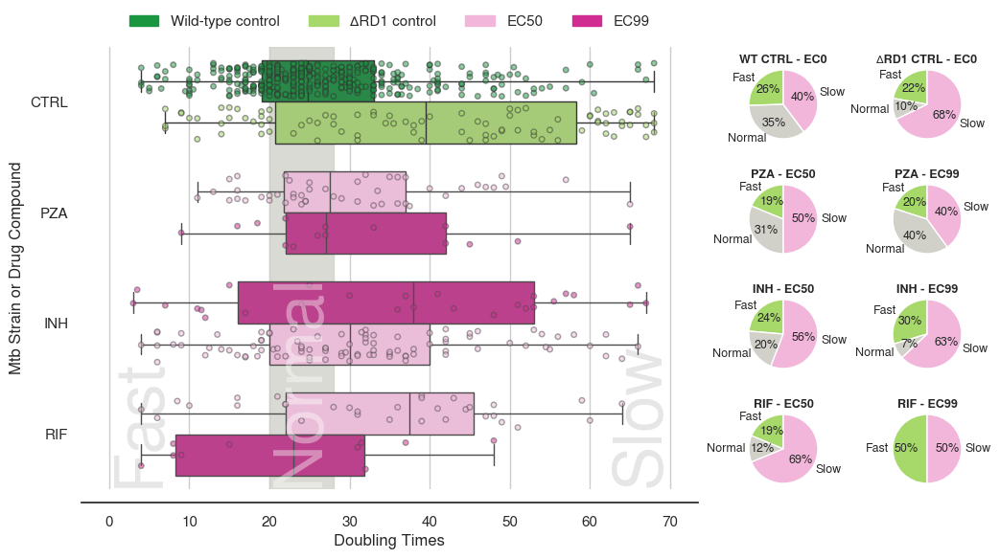

<Figure size 640x480 with 0 Axes>

In [574]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section


subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: 'CTRL' if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Create a new column to differentiate WT and RD1 under the CTRL group
subset_df['CTRL Type'] = subset_df.apply(
    lambda row: row['Strain'] if row['Compound'] == 'CTRL' else None, axis=1
)

# Define the desired order with CTRL at the top
strain_order = ['CTRL', 'PZA', 'INH', 'RIF']

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = subset['Concentration'].unique()

    if compound == 'CTRL':
        # Plot CTRL with WT and RD1 differentiated by hue
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
            whis=[0, 100], width=.75, palette=[expanded_piyg[0], expanded_piyg[1]], ax=ax, order=strain_order
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, ax=ax, order=strain_order
        )

    else:
        # Determine the colors based on the compound and available concentrations
        palette = [expanded_piyg[4] if concentration == 'EC50' else expanded_piyg[5] for concentration in available_concentrations]

        # Plot boxplot and stripplot only for existing concentrations of the compound
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
            whis=[0, 100], width=.75, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=palette, hue_order=available_concentrations, dodge=True, alpha=0.5, ax=ax, order=strain_order
        )
plt.legend('')
sns.despine(offset=10)
plt.show()

In [ ]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section


subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: 'CTRL' if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Create a new column to differentiate WT and RD1 under the CTRL group
subset_df['CTRL Type'] = subset_df.apply(
    lambda row: row['Strain'] if row['Compound'] == 'CTRL' else None, axis=1
)

# Define the desired order with CTRL at the top
strain_order = ['CTRL', 'PZA', 'INH', 'RIF']

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = subset['Concentration'].unique()

    if compound == 'CTRL':
        # Plot CTRL with WT and RD1 differentiated by hue
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
            whis=[0, 100], width=.75, palette=[expanded_piyg[0], expanded_piyg[1]], ax=ax, order=strain_order
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, ax=ax, order=strain_order
        )

    else:
        # Determine the colors based on the compound and available concentrations
        palette = [expanded_piyg[4] if concentration == 'EC50' else expanded_piyg[5] for concentration in available_concentrations]

        # Plot boxplot and stripplot only for existing concentrations of the compound
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
            whis=[0, 100], width=.75, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=palette, hue_order=available_concentrations, dodge=True, alpha=0.5, ax=ax, order=strain_order
        )

# Manually create legend handles for each concentration level
legend_handles = [
    mpatches.Patch(color=expanded_piyg[0], label='Wild-type control'),      # Color for WT CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[1], label='∆RD1 control'),      # Color for RD1 CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[4], label='EC50'),                # Common color for EC50
    mpatches.Patch(color=expanded_piyg[5], label='EC99')                 # Common color for EC99
]

# Add the legend directly above the box plot
ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4, frameon=False)

# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 6: Add vertical text labels within each category region
ax.text(0, 3.35, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(20, 3.35, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70.5, 3.35, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)
# Step 5: Pie Charts (right side)

# Define the explicit compound order with CTRL compounds at the top
compound_order = ['CTRL', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category', 'CTRL Type']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.73 # Adjusted starting y-position to shift pie charts up
y_gap = 0.18

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]] # Custom colors for Fast, Normal, Slow growth

# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    if compound == 'CTRL':
        # Special handling for "CTRL" to differentiate WT and RD1
        ctrl_types = ['WT', 'RD1']
        for ctrl_type in ctrl_types:
            concentration = 'EC0'
            # Get the counts for Fast, Normal, and Slow growth for this compound, concentration, and CTRL type
            fast_count = grouped_counts.get(('CTRL', concentration, 'Fast', ctrl_type), 0)
            normal_count = grouped_counts.get(('CTRL', concentration, 'Normal', ctrl_type), 0)
            slow_count = grouped_counts.get(('CTRL', concentration, 'Slow', ctrl_type), 0)

            # Only plot the pie chart if there are data points for the compound-concentration combination
            if fast_count + normal_count + slow_count > 0:
                counts = [fast_count, normal_count, slow_count]

                # Filter out zero counts and corresponding labels and colors
                filtered_counts = [count for count in counts if count > 0]
                filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
                filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]

                # Adjust x-position for side-by-side pie charts of WT and RD1 (CTRL)
                if concentration == 'EC0' and ctrl_type == 'WT':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC0' and ctrl_type == 'RD1':
                    x_pos = pi_x_start_pos + 0.15  # Shift RD1 pie chart to the right of WT
                elif concentration == 'EC50':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC99':
                    x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

                # Adjust y-position for each CTRL type
                y_pos = pi_y_start_pos - (i * y_gap)

                # Create pie chart on the right side of the corresponding compound
                ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
                ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})

                # Add a label below each pie chart for the compound and concentration
                ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
                ctrl_pie_label = f'{ctrl_type} CTRL - {concentration}' if ctrl_type != 'RD1' else f'∆{ctrl_type} CTRL - {concentration}'
                ax_label.text(0.75, 5.75, ctrl_pie_label, horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
                ax_label.set_axis_off()  # Hide axis for the label
   
# Step 5: Pie Charts (right side)
# Define the explicit compound order with CTRL compounds at the top
compound_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.93 # Adjusted starting y-position to shift pie charts up
y_gap = 0.2

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]]#['#7BDAA4', '#FFEDDF', '#D12B82',]
# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    for j, concentration in enumerate(concentration_order):
        # Get the counts for Fast, Normal, and Slow growth for this compound and concentration
        fast_count = grouped_counts.get((compound, concentration, 'Fast'), 0)
        normal_count = grouped_counts.get((compound, concentration, 'Normal'), 0)
        slow_count = grouped_counts.get((compound, concentration, 'Slow'), 0)

        # Only plot the pie chart if there are data points for the compound-concentration combination
        if fast_count + normal_count + slow_count > 0:
            counts = [fast_count, normal_count, slow_count]
            
            # Filter out zero counts and corresponding labels and colors
            filtered_counts = [count for count in counts if count > 0]
            filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
            filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]
            
            # Adjust x-position for side-by-side pie charts of CTRL (WT and RD1)
            if concentration == 'EC0':
                x_pos = pi_x_start_pos 
            elif concentration == 'EC50':
                x_pos = pi_x_start_pos
            elif concentration == 'EC99':
                x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

            # Adjust y-position for WT (CTRL) and RD1 (CTRL) to ensure they are side by side
            if compound == 'WT (CTRL)':
                y_pos = pi_y_start_pos - y_gap
            elif compound == 'RD1 (CTRL)':
                x_pos += 0.15 # Shift RD1 pie chart to the right of WT
                y_pos = pi_y_start_pos - (i * y_gap)
            else:
                y_pos = pi_y_start_pos - (i * y_gap)

            # Create pie chart on the right side of the corresponding compound
            ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
            ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})
            
            # Add a label below each pie chart for the compound and concentration
            ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
            ax_label.text(0.75, 5.75, f'{compound} - {concentration}', horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
            ax_label.set_axis_off()  # Hide axis for the label

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()


# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()



In [637]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             & (df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             # & (df['mtb_origin'] == 'Growth') 
             & (df['mtb_origin'] != 'Junk') # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
# subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=1914


/tmp/ipykernel_3699928/2962595637.py:204: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


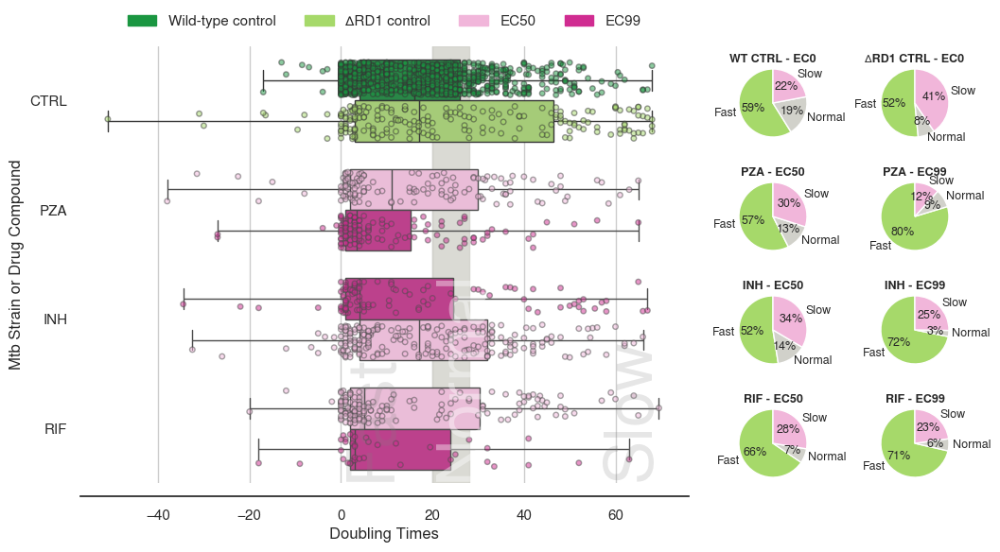

<Figure size 640x480 with 0 Axes>

In [638]:


# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section


subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: 'CTRL' if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Create a new column to differentiate WT and RD1 under the CTRL group
subset_df['CTRL Type'] = subset_df.apply(
    lambda row: row['Strain'] if row['Compound'] == 'CTRL' else None, axis=1
)

# Define the desired order with CTRL at the top
strain_order = ['CTRL', 'PZA', 'INH', 'RIF']

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = subset['Concentration'].unique()

    if compound == 'CTRL':
        # Plot CTRL with WT and RD1 differentiated by hue
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
            whis=[0, 100], width=.75, palette=[expanded_piyg[0], expanded_piyg[1]], ax=ax, order=strain_order
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, ax=ax, order=strain_order
        )

    else:
        # Determine the colors based on the compound and available concentrations
        palette = [expanded_piyg[4] if concentration == 'EC50' else expanded_piyg[5] for concentration in available_concentrations]

        # Plot boxplot and stripplot only for existing concentrations of the compound
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
            whis=[0, 100], width=.75, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=palette, hue_order=available_concentrations, dodge=True, alpha=0.5, ax=ax, order=strain_order
        )

# Manually create legend handles for each concentration level
legend_handles = [
    mpatches.Patch(color=expanded_piyg[0], label='Wild-type control'),      # Color for WT CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[1], label='∆RD1 control'),      # Color for RD1 CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[4], label='EC50'),                # Common color for EC50
    mpatches.Patch(color=expanded_piyg[5], label='EC99')                 # Common color for EC99
]

# Add the legend directly above the box plot
ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4, frameon=False)

# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 6: Add vertical text labels within each category region
ax.text(0, 3.35, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(20, 3.35, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70.5, 3.35, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)
# Step 5: Pie Charts (right side)

# Define the explicit compound order with CTRL compounds at the top
compound_order = ['CTRL', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category', 'CTRL Type']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.73 # Adjusted starting y-position to shift pie charts up
y_gap = 0.18

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]] # Custom colors for Fast, Normal, Slow growth

# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    if compound == 'CTRL':
        # Special handling for "CTRL" to differentiate WT and RD1
        ctrl_types = ['WT', 'RD1']
        for ctrl_type in ctrl_types:
            concentration = 'EC0'
            # Get the counts for Fast, Normal, and Slow growth for this compound, concentration, and CTRL type
            fast_count = grouped_counts.get(('CTRL', concentration, 'Fast', ctrl_type), 0)
            normal_count = grouped_counts.get(('CTRL', concentration, 'Normal', ctrl_type), 0)
            slow_count = grouped_counts.get(('CTRL', concentration, 'Slow', ctrl_type), 0)

            # Only plot the pie chart if there are data points for the compound-concentration combination
            if fast_count + normal_count + slow_count > 0:
                counts = [fast_count, normal_count, slow_count]

                # Filter out zero counts and corresponding labels and colors
                filtered_counts = [count for count in counts if count > 0]
                filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
                filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]

                # Adjust x-position for side-by-side pie charts of WT and RD1 (CTRL)
                if concentration == 'EC0' and ctrl_type == 'WT':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC0' and ctrl_type == 'RD1':
                    x_pos = pi_x_start_pos + 0.15  # Shift RD1 pie chart to the right of WT
                elif concentration == 'EC50':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC99':
                    x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

                # Adjust y-position for each CTRL type
                y_pos = pi_y_start_pos - (i * y_gap)

                # Create pie chart on the right side of the corresponding compound
                ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
                ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})

                # Add a label below each pie chart for the compound and concentration
                ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
                ctrl_pie_label = f'{ctrl_type} CTRL - {concentration}' if ctrl_type != 'RD1' else f'∆{ctrl_type} CTRL - {concentration}'
                ax_label.text(0.75, 5.75, ctrl_pie_label, horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
                ax_label.set_axis_off()  # Hide axis for the label
   
# Step 5: Pie Charts (right side)
# Define the explicit compound order with CTRL compounds at the top
compound_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.93 # Adjusted starting y-position to shift pie charts up
y_gap = 0.2

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]]#['#7BDAA4', '#FFEDDF', '#D12B82',]
# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    for j, concentration in enumerate(concentration_order):
        # Get the counts for Fast, Normal, and Slow growth for this compound and concentration
        fast_count = grouped_counts.get((compound, concentration, 'Fast'), 0)
        normal_count = grouped_counts.get((compound, concentration, 'Normal'), 0)
        slow_count = grouped_counts.get((compound, concentration, 'Slow'), 0)

        # Only plot the pie chart if there are data points for the compound-concentration combination
        if fast_count + normal_count + slow_count > 0:
            counts = [fast_count, normal_count, slow_count]
            
            # Filter out zero counts and corresponding labels and colors
            filtered_counts = [count for count in counts if count > 0]
            filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
            filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]
            
            # Adjust x-position for side-by-side pie charts of CTRL (WT and RD1)
            if concentration == 'EC0':
                x_pos = pi_x_start_pos 
            elif concentration == 'EC50':
                x_pos = pi_x_start_pos
            elif concentration == 'EC99':
                x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

            # Adjust y-position for WT (CTRL) and RD1 (CTRL) to ensure they are side by side
            if compound == 'WT (CTRL)':
                y_pos = pi_y_start_pos - y_gap
            elif compound == 'RD1 (CTRL)':
                x_pos += 0.15 # Shift RD1 pie chart to the right of WT
                y_pos = pi_y_start_pos - (i * y_gap)
            else:
                y_pos = pi_y_start_pos - (i * y_gap)

            # Create pie chart on the right side of the corresponding compound
            ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
            ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})
            
            # Add a label below each pie chart for the compound and concentration
            ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
            ax_label.text(0.75, 5.75, f'{compound} - {concentration}', horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
            ax_label.set_axis_off()  # Hide axis for the label

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()


# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()



In [644]:
df[df['dMtb Area (µm)']<0]['dMtb Area (µm)']

616       -2.525376
617       -2.525376
618       -2.525376
619       -2.525376
620       -2.525376
             ...   
1312257   -0.111742
1312258   -0.111742
1312259   -0.111742
1312260   -0.111742
1312261   -0.111742
Name: dMtb Area (µm), Length: 238233, dtype: float64

In [652]:
df[df['dMtb Area (µm)']<0]['dMtb Area (µm)'].mean()

-14.746622678833216

In [649]:
df[df['dMtb Area (µm)']>=0]['dMtb Area (µm)'].mean()

46.40279197277636

In [651]:
df[df['Strain'] == 'UNI']

,ID,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,...,Edge Status,Uptake,dMtb Area between frames (µm),Mtb Area Processed (µm),Time Model (hours),Mtb Area Model (µm),mtb_origin,Doubling Amounts,Doubling Times,r2
138,1.3.2.ND0002,0.0,0.0,0.0,4649.351562,2080.574775,NaN,False,False,107.845200,...,False,False,NaN,NaN,NaN,NaN,None,None,None,1.0
139,1.3.2.ND0002,0.5,0.0,0.0,4973.001953,2080.574775,NaN,False,False,113.264671,...,False,False,0.0,NaN,NaN,NaN,None,None,None,1.0
140,1.3.2.ND0002,1.0,0.0,0.0,4687.857910,2080.574775,NaN,False,False,116.562256,...,False,False,0.0,NaN,NaN,NaN,None,None,None,1.0
141,1.3.2.ND0002,1.5,0.0,0.0,4209.064453,2080.574775,NaN,False,False,111.890106,...,False,False,0.0,NaN,NaN,NaN,None,None,None,1.0
142,1.3.2.ND0002,2.0,0.0,0.0,4061.855225,2080.574775,False,False,False,114.113556,...,False,False,0.0,NaN,0.0,0.0,None,None,None,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1311041,991.3.2.ND0003,60.5,NaN,0.0,NaN,677.270144,NaN,False,False,228.873093,...,False,False,NaN,0.0,NaN,NaN,None,None,None,1.0
1311042,991.3.2.ND0003,61.0,0.0,0.0,1308.547152,677.270144,NaN,False,False,223.946899,...,False,False,NaN,0.0,NaN,NaN,None,None,None,1.0
1311043,991.3.2.ND0003,61.5,0.0,0.0,1922.079482,677.270144,NaN,False,False,208.372070,...,False,False,0.0,0.0,NaN,NaN,None,None,None,1.0
1311044,991.3.2.ND0003,62.0,NaN,0.0,NaN,677.270144,NaN,False,False,208.372070,...,False,False,NaN,0.0,NaN,NaN,None,None,None,1.0


# Proportion of internal growth versus THE OTHER

In [610]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             & (df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             # & (df['mtb_origin'] != 'Growth') 
             & (df['mtb_origin'] != 'Junk') # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=1756


/tmp/ipykernel_3699928/2962595637.py:204: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


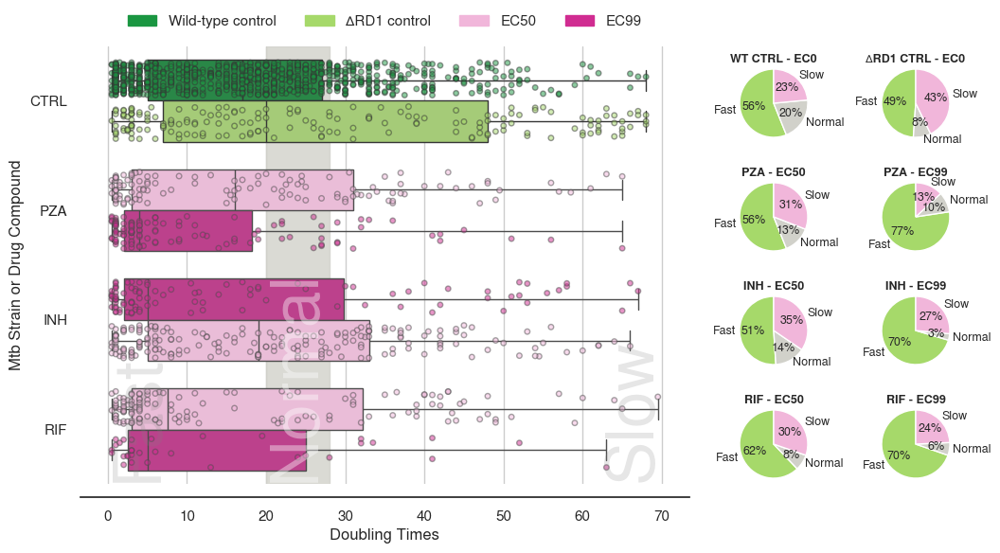

<Figure size 640x480 with 0 Axes>

In [611]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section


subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: 'CTRL' if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Create a new column to differentiate WT and RD1 under the CTRL group
subset_df['CTRL Type'] = subset_df.apply(
    lambda row: row['Strain'] if row['Compound'] == 'CTRL' else None, axis=1
)

# Define the desired order with CTRL at the top
strain_order = ['CTRL', 'PZA', 'INH', 'RIF']

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = subset['Concentration'].unique()

    if compound == 'CTRL':
        # Plot CTRL with WT and RD1 differentiated by hue
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
            whis=[0, 100], width=.75, palette=[expanded_piyg[0], expanded_piyg[1]], ax=ax, order=strain_order
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, ax=ax, order=strain_order
        )

    else:
        # Determine the colors based on the compound and available concentrations
        palette = [expanded_piyg[4] if concentration == 'EC50' else expanded_piyg[5] for concentration in available_concentrations]

        # Plot boxplot and stripplot only for existing concentrations of the compound
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
            whis=[0, 100], width=.75, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=palette, hue_order=available_concentrations, dodge=True, alpha=0.5, ax=ax, order=strain_order
        )

# Manually create legend handles for each concentration level
legend_handles = [
    mpatches.Patch(color=expanded_piyg[0], label='Wild-type control'),      # Color for WT CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[1], label='∆RD1 control'),      # Color for RD1 CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[4], label='EC50'),                # Common color for EC50
    mpatches.Patch(color=expanded_piyg[5], label='EC99')                 # Common color for EC99
]

# Add the legend directly above the box plot
ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4, frameon=False)

# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 6: Add vertical text labels within each category region
ax.text(0, 3.35, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(20, 3.35, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70.5, 3.35, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)
# Step 5: Pie Charts (right side)

# Define the explicit compound order with CTRL compounds at the top
compound_order = ['CTRL', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category', 'CTRL Type']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.73 # Adjusted starting y-position to shift pie charts up
y_gap = 0.18

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]] # Custom colors for Fast, Normal, Slow growth

# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    if compound == 'CTRL':
        # Special handling for "CTRL" to differentiate WT and RD1
        ctrl_types = ['WT', 'RD1']
        for ctrl_type in ctrl_types:
            concentration = 'EC0'
            # Get the counts for Fast, Normal, and Slow growth for this compound, concentration, and CTRL type
            fast_count = grouped_counts.get(('CTRL', concentration, 'Fast', ctrl_type), 0)
            normal_count = grouped_counts.get(('CTRL', concentration, 'Normal', ctrl_type), 0)
            slow_count = grouped_counts.get(('CTRL', concentration, 'Slow', ctrl_type), 0)

            # Only plot the pie chart if there are data points for the compound-concentration combination
            if fast_count + normal_count + slow_count > 0:
                counts = [fast_count, normal_count, slow_count]

                # Filter out zero counts and corresponding labels and colors
                filtered_counts = [count for count in counts if count > 0]
                filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
                filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]

                # Adjust x-position for side-by-side pie charts of WT and RD1 (CTRL)
                if concentration == 'EC0' and ctrl_type == 'WT':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC0' and ctrl_type == 'RD1':
                    x_pos = pi_x_start_pos + 0.15  # Shift RD1 pie chart to the right of WT
                elif concentration == 'EC50':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC99':
                    x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

                # Adjust y-position for each CTRL type
                y_pos = pi_y_start_pos - (i * y_gap)

                # Create pie chart on the right side of the corresponding compound
                ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
                ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})

                # Add a label below each pie chart for the compound and concentration
                ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
                ctrl_pie_label = f'{ctrl_type} CTRL - {concentration}' if ctrl_type != 'RD1' else f'∆{ctrl_type} CTRL - {concentration}'
                ax_label.text(0.75, 5.75, ctrl_pie_label, horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
                ax_label.set_axis_off()  # Hide axis for the label
   
# Step 5: Pie Charts (right side)
# Define the explicit compound order with CTRL compounds at the top
compound_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.93 # Adjusted starting y-position to shift pie charts up
y_gap = 0.2

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]]#['#7BDAA4', '#FFEDDF', '#D12B82',]
# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    for j, concentration in enumerate(concentration_order):
        # Get the counts for Fast, Normal, and Slow growth for this compound and concentration
        fast_count = grouped_counts.get((compound, concentration, 'Fast'), 0)
        normal_count = grouped_counts.get((compound, concentration, 'Normal'), 0)
        slow_count = grouped_counts.get((compound, concentration, 'Slow'), 0)

        # Only plot the pie chart if there are data points for the compound-concentration combination
        if fast_count + normal_count + slow_count > 0:
            counts = [fast_count, normal_count, slow_count]
            
            # Filter out zero counts and corresponding labels and colors
            filtered_counts = [count for count in counts if count > 0]
            filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
            filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]
            
            # Adjust x-position for side-by-side pie charts of CTRL (WT and RD1)
            if concentration == 'EC0':
                x_pos = pi_x_start_pos 
            elif concentration == 'EC50':
                x_pos = pi_x_start_pos
            elif concentration == 'EC99':
                x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

            # Adjust y-position for WT (CTRL) and RD1 (CTRL) to ensure they are side by side
            if compound == 'WT (CTRL)':
                y_pos = pi_y_start_pos - y_gap
            elif compound == 'RD1 (CTRL)':
                x_pos += 0.15 # Shift RD1 pie chart to the right of WT
                y_pos = pi_y_start_pos - (i * y_gap)
            else:
                y_pos = pi_y_start_pos - (i * y_gap)

            # Create pie chart on the right side of the corresponding compound
            ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
            ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})
            
            # Add a label below each pie chart for the compound and concentration
            ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
            ax_label.text(0.75, 5.75, f'{compound} - {concentration}', horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
            ax_label.set_axis_off()  # Hide axis for the label

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()


# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()



In [619]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             & (df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             # & (df['mtb_origin'] != 'Growth') 
             & (df['mtb_origin'] != 'Junk') # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=1756


/tmp/ipykernel_3699928/1794948089.py:237: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


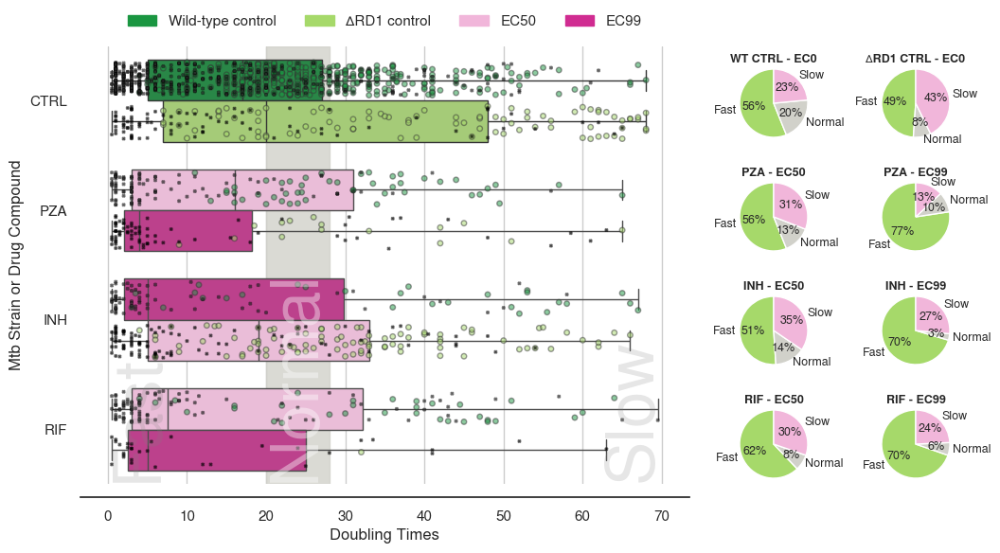

<Figure size 640x480 with 0 Axes>

In [623]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section


subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: 'CTRL' if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Create a new column to differentiate WT and RD1 under the CTRL group
subset_df['CTRL Type'] = subset_df.apply(
    lambda row: row['Strain'] if row['Compound'] == 'CTRL' else None, axis=1
)

# Define the desired order with CTRL at the top
strain_order = ['CTRL', 'PZA', 'INH', 'RIF']

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = subset['Concentration'].unique()

    if compound == 'CTRL':
        # Plot CTRL with WT and RD1 differentiated by hue
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
            whis=[0, 100], width=.75, palette=[expanded_piyg[0], expanded_piyg[1]], ax=ax, order=strain_order
        )
        # Separate your data based on mtb_origin
        growth_data = subset[subset['mtb_origin'] == 'Growth']
        non_growth_data = subset[subset['mtb_origin'] != 'Growth']
        
        # Plot the data where mtb_origin is 'Growth' with one marker
        sns.stripplot(
            data=growth_data, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, marker='o', ax=ax, order=strain_order
        )
        
        # Plot the data where mtb_origin is not 'Growth' with a different marker
        sns.stripplot(
            data=non_growth_data, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type", size=2,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=['gray', 'black'], dodge=True, alpha=0.5, marker='X', ax=ax, order=strain_order
        )
        
        # Remove legend duplication if both plots generate it
        ax.legend_.remove()  # Remove duplicate legends
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


    else:
        # Determine the colors based on the compound and available concentrations
        palette = [expanded_piyg[4] if concentration == 'EC50' else expanded_piyg[5] for concentration in available_concentrations]

        # Plot boxplot and stripplot only for existing concentrations of the compound
        sns.boxplot(
            data=subset, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
            whis=[0, 100], width=.75, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order
        )

        # Separate your data based on mtb_origin
        growth_data = subset[subset['mtb_origin'] == 'Growth']
        non_growth_data = subset[subset['mtb_origin'] != 'Growth']
        
        # Plot the data where mtb_origin is 'Growth' with one marker
        sns.stripplot(
            data=growth_data, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, marker='o', ax=ax, order=strain_order
        )
        
        # Plot the data where mtb_origin is not 'Growth' with a different marker
        sns.stripplot(
            data=non_growth_data, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=2,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=['gray', 'black'], dodge=True, alpha=0.5, marker='X', ax=ax, order=strain_order
        )
        
        # Remove legend duplication if both plots generate it
        ax.legend_.remove()  # Remove duplicate legends
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


# Manually create legend handles for each concentration level
legend_handles = [
    mpatches.Patch(color=expanded_piyg[0], label='Wild-type control'),      # Color for WT CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[1], label='∆RD1 control'),      # Color for RD1 CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[4], label='EC50'),                # Common color for EC50
    mpatches.Patch(color=expanded_piyg[5], label='EC99')                 # Common color for EC99
]

# Add the legend directly above the box plot
ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4, frameon=False)

# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 6: Add vertical text labels within each category region
ax.text(0, 3.35, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(20, 3.35, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70.5, 3.35, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)
# Step 5: Pie Charts (right side)

# Define the explicit compound order with CTRL compounds at the top
compound_order = ['CTRL', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category', 'CTRL Type']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.73 # Adjusted starting y-position to shift pie charts up
y_gap = 0.18

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]] # Custom colors for Fast, Normal, Slow growth

# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    if compound == 'CTRL':
        # Special handling for "CTRL" to differentiate WT and RD1
        ctrl_types = ['WT', 'RD1']
        for ctrl_type in ctrl_types:
            concentration = 'EC0'
            # Get the counts for Fast, Normal, and Slow growth for this compound, concentration, and CTRL type
            fast_count = grouped_counts.get(('CTRL', concentration, 'Fast', ctrl_type), 0)
            normal_count = grouped_counts.get(('CTRL', concentration, 'Normal', ctrl_type), 0)
            slow_count = grouped_counts.get(('CTRL', concentration, 'Slow', ctrl_type), 0)

            # Only plot the pie chart if there are data points for the compound-concentration combination
            if fast_count + normal_count + slow_count > 0:
                counts = [fast_count, normal_count, slow_count]

                # Filter out zero counts and corresponding labels and colors
                filtered_counts = [count for count in counts if count > 0]
                filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
                filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]

                # Adjust x-position for side-by-side pie charts of WT and RD1 (CTRL)
                if concentration == 'EC0' and ctrl_type == 'WT':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC0' and ctrl_type == 'RD1':
                    x_pos = pi_x_start_pos + 0.15  # Shift RD1 pie chart to the right of WT
                elif concentration == 'EC50':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC99':
                    x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

                # Adjust y-position for each CTRL type
                y_pos = pi_y_start_pos - (i * y_gap)

                # Create pie chart on the right side of the corresponding compound
                ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
                ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})

                # Add a label below each pie chart for the compound and concentration
                ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
                ctrl_pie_label = f'{ctrl_type} CTRL - {concentration}' if ctrl_type != 'RD1' else f'∆{ctrl_type} CTRL - {concentration}'
                ax_label.text(0.75, 5.75, ctrl_pie_label, horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
                ax_label.set_axis_off()  # Hide axis for the label
   
# Step 5: Pie Charts (right side)
# Define the explicit compound order with CTRL compounds at the top
compound_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.93 # Adjusted starting y-position to shift pie charts up
y_gap = 0.2

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]]#['#7BDAA4', '#FFEDDF', '#D12B82',]
# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    for j, concentration in enumerate(concentration_order):
        # Get the counts for Fast, Normal, and Slow growth for this compound and concentration
        fast_count = grouped_counts.get((compound, concentration, 'Fast'), 0)
        normal_count = grouped_counts.get((compound, concentration, 'Normal'), 0)
        slow_count = grouped_counts.get((compound, concentration, 'Slow'), 0)

        # Only plot the pie chart if there are data points for the compound-concentration combination
        if fast_count + normal_count + slow_count > 0:
            counts = [fast_count, normal_count, slow_count]
            
            # Filter out zero counts and corresponding labels and colors
            filtered_counts = [count for count in counts if count > 0]
            filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
            filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]
            
            # Adjust x-position for side-by-side pie charts of CTRL (WT and RD1)
            if concentration == 'EC0':
                x_pos = pi_x_start_pos 
            elif concentration == 'EC50':
                x_pos = pi_x_start_pos
            elif concentration == 'EC99':
                x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

            # Adjust y-position for WT (CTRL) and RD1 (CTRL) to ensure they are side by side
            if compound == 'WT (CTRL)':
                y_pos = pi_y_start_pos - y_gap
            elif compound == 'RD1 (CTRL)':
                x_pos += 0.15 # Shift RD1 pie chart to the right of WT
                y_pos = pi_y_start_pos - (i * y_gap)
            else:
                y_pos = pi_y_start_pos - (i * y_gap)

            # Create pie chart on the right side of the corresponding compound
            ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
            ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})
            
            # Add a label below each pie chart for the compound and concentration
            ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
            ax_label.text(0.75, 5.75, f'{compound} - {concentration}', horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
            ax_label.set_axis_off()  # Hide axis for the label

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()


# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()



In [681]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             & (df['r2'] >= 0.8) 
             & (df['Edge Status'] == False) 
             # & (df['mtb_origin'] != 'Growth') 
             & (df['mtb_origin'] != 'Junk') # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=1756


/tmp/ipykernel_3699928/1192872950.py:238: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


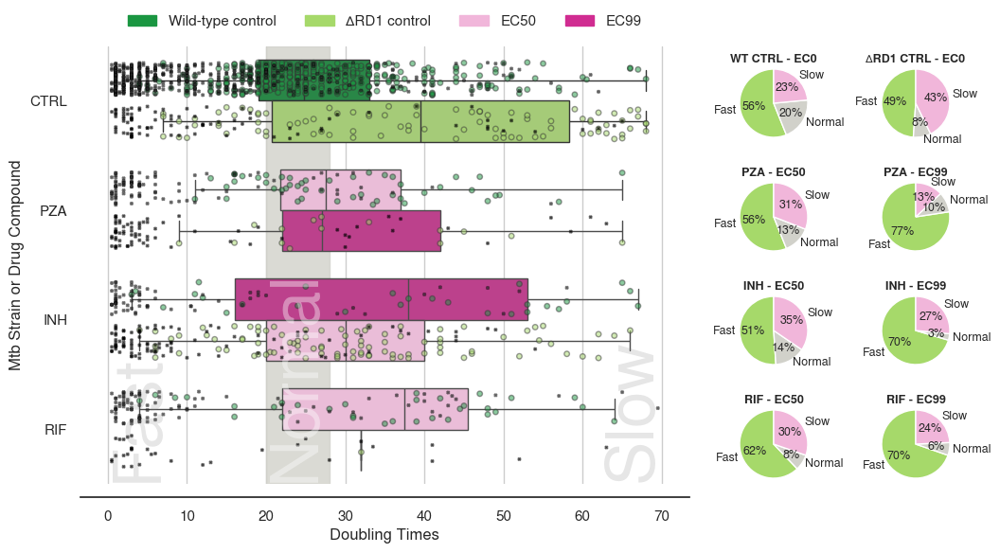

<Figure size 640x480 with 0 Axes>

In [682]:
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section


subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: 'CTRL' if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Create a new column to differentiate WT and RD1 under the CTRL group
subset_df['CTRL Type'] = subset_df.apply(
    lambda row: row['Strain'] if row['Compound'] == 'CTRL' else None, axis=1
)

# Define the desired order with CTRL at the top
strain_order = ['CTRL', 'PZA', 'INH', 'RIF']

# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = subset['Concentration'].unique()

    if compound == 'CTRL':
        
        # Separate your data based on mtb_origin
        growth_data = subset[subset['mtb_origin'] == 'Growth']
        non_growth_data = subset[subset['mtb_origin'] != 'Growth']

        # Plot CTRL with WT and RD1 differentiated by hue
        sns.boxplot(
            data=growth_data, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
            whis=[0, 100], width=.75, palette=[expanded_piyg[0], expanded_piyg[1]], ax=ax, order=strain_order
        )
        
        # Plot the data where mtb_origin is 'Growth' with one marker
        sns.stripplot(
            data=growth_data, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, marker='o', ax=ax, order=strain_order
        )
        
        # Plot the data where mtb_origin is not 'Growth' with a different marker
        sns.stripplot(
            data=non_growth_data, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type", size=2,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=['gray', 'black'], dodge=True, alpha=0.5, marker='X', ax=ax, order=strain_order
        )
        
        # Remove legend duplication if both plots generate it
        ax.legend_.remove()  # Remove duplicate legends
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


    else:
        # Determine the colors based on the compound and available concentrations
        palette = [expanded_piyg[4] if concentration == 'EC50' else expanded_piyg[5] for concentration in available_concentrations]

        # Separate your data based on mtb_origin
        growth_data = subset[subset['mtb_origin'] == 'Growth']
        non_growth_data = subset[subset['mtb_origin'] != 'Growth']
        
        # Plot boxplot and stripplot only for existing concentrations of the compound
        sns.boxplot(
            data=growth_data, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
            whis=[0, 100], width=.75, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order
        )
        # Plot the data where mtb_origin is 'Growth' with one marker
        sns.stripplot(
            data=growth_data, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, marker='o', ax=ax, order=strain_order
        )
        
        # Plot the data where mtb_origin is not 'Growth' with a different marker
        sns.stripplot(
            data=non_growth_data, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration", size=2,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=['gray', 'black'], dodge=True, alpha=0.5, marker='X', ax=ax, order=strain_order
        )
        
        # Remove legend duplication if both plots generate it
        ax.legend_.remove()  # Remove duplicate legends
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


# Manually create legend handles for each concentration level
legend_handles = [
    mpatches.Patch(color=expanded_piyg[0], label='Wild-type control'),      # Color for WT CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[1], label='∆RD1 control'),      # Color for RD1 CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[4], label='EC50'),                # Common color for EC50
    mpatches.Patch(color=expanded_piyg[5], label='EC99')                 # Common color for EC99
]

# Add the legend directly above the box plot
ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4, frameon=False)

# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 6: Add vertical text labels within each category region
ax.text(0, 3.35, 'Fast', fontsize=50, color='gray', alpha=0.2, ha='left', va='baseline', rotation=90)
ax.text(20, 3.35, 'Normal', fontsize=50, color='white', alpha=0.4, ha='left', va='baseline', rotation=90)
ax.text(70.5, 3.35, 'Slow', fontsize=50, color='gray', alpha=0.2, ha='right', va='baseline', rotation=90)
# Step 5: Pie Charts (right side)

# Define the explicit compound order with CTRL compounds at the top
compound_order = ['CTRL', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category', 'CTRL Type']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.73 # Adjusted starting y-position to shift pie charts up
y_gap = 0.18

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]] # Custom colors for Fast, Normal, Slow growth

# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    if compound == 'CTRL':
        # Special handling for "CTRL" to differentiate WT and RD1
        ctrl_types = ['WT', 'RD1']
        for ctrl_type in ctrl_types:
            concentration = 'EC0'
            # Get the counts for Fast, Normal, and Slow growth for this compound, concentration, and CTRL type
            fast_count = grouped_counts.get(('CTRL', concentration, 'Fast', ctrl_type), 0)
            normal_count = grouped_counts.get(('CTRL', concentration, 'Normal', ctrl_type), 0)
            slow_count = grouped_counts.get(('CTRL', concentration, 'Slow', ctrl_type), 0)

            # Only plot the pie chart if there are data points for the compound-concentration combination
            if fast_count + normal_count + slow_count > 0:
                counts = [fast_count, normal_count, slow_count]

                # Filter out zero counts and corresponding labels and colors
                filtered_counts = [count for count in counts if count > 0]
                filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
                filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]

                # Adjust x-position for side-by-side pie charts of WT and RD1 (CTRL)
                if concentration == 'EC0' and ctrl_type == 'WT':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC0' and ctrl_type == 'RD1':
                    x_pos = pi_x_start_pos + 0.15  # Shift RD1 pie chart to the right of WT
                elif concentration == 'EC50':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC99':
                    x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

                # Adjust y-position for each CTRL type
                y_pos = pi_y_start_pos - (i * y_gap)

                # Create pie chart on the right side of the corresponding compound
                ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
                ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})

                # Add a label below each pie chart for the compound and concentration
                ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
                ctrl_pie_label = f'{ctrl_type} CTRL - {concentration}' if ctrl_type != 'RD1' else f'∆{ctrl_type} CTRL - {concentration}'
                ax_label.text(0.75, 5.75, ctrl_pie_label, horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
                ax_label.set_axis_off()  # Hide axis for the label
   
# Step 5: Pie Charts (right side)
# Define the explicit compound order with CTRL compounds at the top
compound_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category
grouped_counts = subset_df.groupby(['Mtb Strain or Drug Compound', 'Concentration', 'Growth Category']).size()

pi_x_start_pos = 0.75  # Starting x-position for pie charts
pi_y_start_pos = 0.93 # Adjusted starting y-position to shift pie charts up
y_gap = 0.2

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]]#['#7BDAA4', '#FFEDDF', '#D12B82',]
# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(compound_order):
    for j, concentration in enumerate(concentration_order):
        # Get the counts for Fast, Normal, and Slow growth for this compound and concentration
        fast_count = grouped_counts.get((compound, concentration, 'Fast'), 0)
        normal_count = grouped_counts.get((compound, concentration, 'Normal'), 0)
        slow_count = grouped_counts.get((compound, concentration, 'Slow'), 0)

        # Only plot the pie chart if there are data points for the compound-concentration combination
        if fast_count + normal_count + slow_count > 0:
            counts = [fast_count, normal_count, slow_count]
            
            # Filter out zero counts and corresponding labels and colors
            filtered_counts = [count for count in counts if count > 0]
            filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
            filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]
            
            # Adjust x-position for side-by-side pie charts of CTRL (WT and RD1)
            if concentration == 'EC0':
                x_pos = pi_x_start_pos 
            elif concentration == 'EC50':
                x_pos = pi_x_start_pos
            elif concentration == 'EC99':
                x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50

            # Adjust y-position for WT (CTRL) and RD1 (CTRL) to ensure they are side by side
            if compound == 'WT (CTRL)':
                y_pos = pi_y_start_pos - y_gap
            elif compound == 'RD1 (CTRL)':
                x_pos += 0.15 # Shift RD1 pie chart to the right of WT
                y_pos = pi_y_start_pos - (i * y_gap)
            else:
                y_pos = pi_y_start_pos - (i * y_gap)

            # Create pie chart on the right side of the corresponding compound
            ax_pie = fig.add_axes([x_pos, y_pos, 0.15, 0.15], aspect=1)  # Position for each pie chart
            ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})
            
            # Add a label below each pie chart for the compound and concentration
            ax_label = fig.add_axes([x_pos, y_pos - 0.02, 0.1, 0.03])  # Smaller box for the label
            ax_label.text(0.75, 5.75, f'{compound} - {concentration}', horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
            ax_label.set_axis_off()  # Hide axis for the label

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()


# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Show the plot
plt.tight_layout()
plt.show()



# Plot as above but over different y variables

In [779]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             & (df['r2'] >= 0.7) 
             # & (df['Edge Status'] == False) 
             # & (df['mtb_origin'] != 'Growth') 
             & (df['mtb_origin'] != 'Junk') # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=2444


/tmp/ipykernel_3699928/2774451935.py:165: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


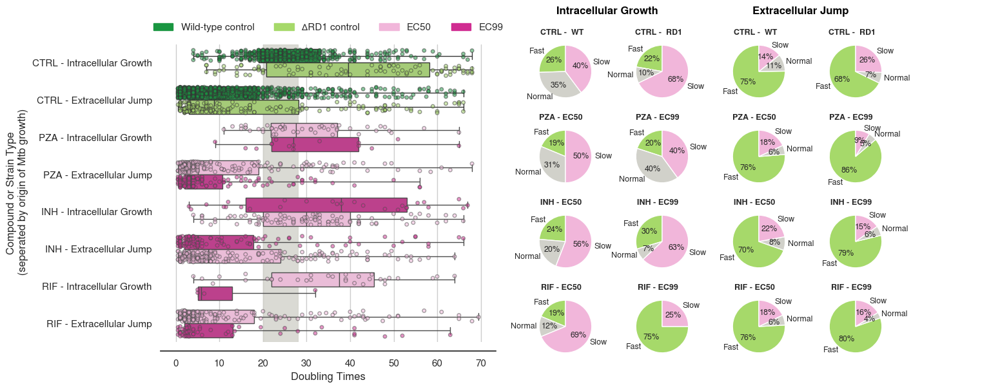

In [803]:


subset_df['Mtb Strain or Drug Compound'] = subset_df.apply(
    lambda row: 'CTRL' if row['Compound'] == 'CTRL' else row['Compound'], axis=1
)

# Create a new column to differentiate WT and RD1 under the CTRL group
subset_df['CTRL Type'] = subset_df.apply(
    lambda row: row['Strain'] if row['Compound'] == 'CTRL' else None, axis=1
)

# Update y-axis to reflect segregation by mrb_origin
subset_df['Y Axis Label'] = subset_df.apply(
    lambda row: f"{row['Mtb Strain or Drug Compound']} - Intracellular Growth" if row['mtb_origin'] == 'Growth' 
                else f"{row['Mtb Strain or Drug Compound']} - Extracellular Jump", axis=1
)

# Define the new order to reflect both conditions (Growth vs. Non-Growth)
strain_order_with_origin = [
    f'CTRL - Intracellular Growth', f'CTRL - Extracellular Jump', 
    f'PZA - Intracellular Growth', f'PZA - Extracellular Jump', 
    f'INH - Intracellular Growth', f'INH - Extracellular Jump', 
    f'RIF - Intracellular Growth', f'RIF - Extracellular Jump'
]
# Step 1: Bin the Doubling Times into categories
bins = [0, 20, 28, float('inf')]  # Define the bins: <20, 20-28, >28
labels = ['Fast', 'Normal', 'Slow']  # Labels for each bin
subset_df['Growth Category'] = pd.cut(subset_df['Doubling Times'], bins=bins, labels=labels, right=False)

# Step 2: Initialize the figure with GridSpec to accommodate pie charts
fig = plt.figure(figsize=(10, 6))  # Adjusted size for the main plot and pie charts
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Grid with main plot and pie chart section


# Main Plot (left side)
ax = plt.subplot(gs[0])

# Iterate over each compound to plot only available concentrations
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    available_concentrations = subset['Concentration'].unique()

    if compound == 'CTRL':
        # Plot CTRL with WT and RD1 differentiated by hue and mtb_origin
        sns.boxplot(
            data=subset, x="Doubling Times", y="Y Axis Label", hue="CTRL Type",
            whis=[0, 100], width=.75, palette=[expanded_piyg[0], expanded_piyg[1]], ax=ax, order=strain_order_with_origin
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Y Axis Label", hue="CTRL Type", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=[expanded_piyg[0], expanded_piyg[1]], dodge=True, alpha=0.5, ax=ax, order=strain_order_with_origin
        )

    else:
        # Determine the colors based on the compound and available concentrations
        palette = [expanded_piyg[4] if concentration == 'EC50' else expanded_piyg[5] for concentration in available_concentrations]

        # Plot boxplot and stripplot only for existing concentrations of the compound
        sns.boxplot(
            data=subset, x="Doubling Times", y="Y Axis Label", hue="Concentration",
            whis=[0, 100], width=.75, palette=palette, hue_order=available_concentrations, ax=ax, order=strain_order_with_origin
        )

        sns.stripplot(
            data=subset, x="Doubling Times", y="Y Axis Label", hue="Concentration", size=4,
            edgecolor='gray', linewidth=1, jitter=0.3,
            palette=palette, hue_order=available_concentrations, dodge=True, alpha=0.5, ax=ax, order=strain_order_with_origin
        )

# Manually create legend handles for each concentration level
legend_handles = [
    mpatches.Patch(color=expanded_piyg[0], label='Wild-type control'),      # Color for WT CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[1], label='∆RD1 control'),      # Color for RD1 CTRL (EC0)
    mpatches.Patch(color=expanded_piyg[4], label='EC50'),                # Common color for EC50
    mpatches.Patch(color=expanded_piyg[5], label='EC99')                 # Common color for EC99
]

# Add the legend directly above the box plot
ax.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.1), ncol=4, frameon=False)
ax.set_ylabel('Compound or Strain Type\n (seperated by origin of Mtb growth)')

# Add shaded regions for each growth category
ax.axvspan(0, 20, color=expanded_piyg[3], alpha=0, label='Fast (<20h)')
ax.axvspan(20, 28, color=expanded_piyg[3], alpha=0.8, label='Normal (20-28h)')
ax.axvspan(28, 70, color=expanded_piyg[3], alpha=0., label='Slow (>28h)')

# Step 5: Pie Charts (right side)
# Define the explicit compound order with CTRL compounds at the top
compound_order = ['WT (CTRL)', 'RD1 (CTRL)', 'PZA', 'INH', 'RIF']
concentration_order = ['EC50', 'EC0', 'EC99']
growth_labels = ['Fast', 'Normal', 'Slow']  # Growth category labels
colors = [expanded_piyg[0], expanded_piyg[3], expanded_piyg[-1]]  # Colors for Fast, Normal, Slow growth

# Get total counts for each compound, concentration, and growth category (with mtb_origin segregation)
grouped_counts = subset_df.groupby(['Y Axis Label', 'Concentration', 'Growth Category', 'Strain']).size()

pi_x_start_pos = 0.8  # Starting x-position for pie charts
pi_y_start_pos = 0.75  # Adjusted starting y-position to shift pie charts up
y_gap = 0.11

pie_colormap = [expanded_piyg[1], expanded_piyg[3], expanded_piyg[4]]  # Colors for Fast, Normal, Slow growth

# Iterate over each compound in the explicitly defined order
for i, compound in enumerate(strain_order_with_origin):
    for j, concentration in enumerate(concentration_order):
        for strain in ['WT', 'RD1']:
            fast_count = grouped_counts.get((compound, concentration, 'Fast', strain), 0)
            normal_count = grouped_counts.get((compound, concentration, 'Normal', strain), 0)
            slow_count = grouped_counts.get((compound, concentration, 'Slow', strain), 0)
    
            # Only plot the pie chart if there are data points for the compound-concentration-mtb_origin combination
            if fast_count + normal_count + slow_count > 0:
                counts = [fast_count, normal_count, slow_count]
                # Filter out zero counts and corresponding labels and colors
                filtered_counts = [count for count in counts if count > 0]
                filtered_labels = [growth_labels[idx] for idx, count in enumerate(counts) if count > 0]
                filtered_colors = [pie_colormap[idx] for idx, count in enumerate(counts) if count > 0]
                
                # Adjust x-position for side-by-side pie charts of CTRL (WT and RD1)
                if concentration == 'EC0':
                    x_pos = pi_x_start_pos 
                elif concentration == 'EC50':
                    x_pos = pi_x_start_pos
                elif concentration == 'EC99':
                    x_pos = pi_x_start_pos + 0.15  # Offset EC99 to the right of EC50
    
                # Adjust y-position for WT (CTRL) and RD1 (CTRL) to ensure they are stacked properly
                y_pos = pi_y_start_pos - (i * y_gap)
                if strain == 'RD1':
                    x_pos = pi_x_start_pos + 0.15
                
                if 'Extracellular Jump' in compound:
                    x_pos += 0.3
                    y_pos = pi_y_start_pos - ((i-1) * y_gap)
                # Create pie chart on the right side of the corresponding compound
                ax_pie = fig.add_axes([x_pos, y_pos, 0.17, 0.17], aspect=1)  # Position for each pie chart
                ax_pie.pie(filtered_counts, colors=filtered_colors, labels=filtered_labels, autopct='%1.0f%%', startangle=90, textprops={'fontsize': 9})
                
                # Add a label below each pie chart for the compound, concentration, and mtb_origin type
                compound_label = compound.split(' -')[0]
                concentration_label = concentration if concentration != 'EC0' else ''
                strain_label =  strain if concentration == 'EC0' else ''
                ax_label = fig.add_axes([x_pos+0.03, y_pos + 0.17, 0.1, 0.03])  # Smaller box for the label
                ax_label.text(0.5, 0.5, f'{compound_label} - {concentration_label} {strain_label}', horizontalalignment='center', verticalalignment='center', fontsize=9, fontweight='bold')
                ax_label.set_axis_off()  # Hide axis for the label

# Final tweaks for grid and appearance
ax.xaxis.grid(True)
sns.despine(offset=10, left=True)

# Shaded region for the two pie chart categories
# Intracellular Growth
ax_pie_background_1 = fig.add_axes([0.75, 0.15, 0.4, 0.8], facecolor=expanded_piyg[4], alpha=0.9)
ax_pie_background_1.set_axis_off()

# Extracellular Jump
ax_pie_background_2 = fig.add_axes([1.15, 0.15, 0.4, 0.8], facecolor=expanded_piyg[1], alpha=0.9)
ax_pie_background_2.set_axis_off()

# Add labels at the top of each shaded region
ax_pie_background_1.text(0.5, 1.05, 'Intracellular Growth', fontsize=12, fontweight='bold', color='black', ha='center', va='center')
ax_pie_background_2.text(0.25, 1.05, 'Extracellular Jump', fontsize=12, fontweight='bold', color='black', ha='center', va='center')

# Show the plot
plt.tight_layout()


# Statistical tests

In [676]:
# Prepare the subset DataFrame, filtering for WT strain or CTRL with RD1
subset_df = df[((df['Strain'] == 'WT') | ((df['Strain'] == 'RD1') & (df['Compound'] == 'CTRL'))) 
             # & (df['r2'] >= 0.8) 
             # & (df['Edge Status'] == False) 
             & (df['mtb_origin'] == 'Growth') 
             # & (df['mtb_origin'] != 'Junk') # are we really doing this right now? or after figure 3? 
              ].drop_duplicates(subset=['ID'])

# Continue with the usual process of exploding and filtering Doubling Times
subset_df = subset_df.explode('Doubling Times')
subset_df['Doubling Times'] = pd.to_numeric(subset_df['Doubling Times'], errors='coerce')
subset_df = subset_df[subset_df['Doubling Times'].notna()]
subset_df = subset_df[subset_df['Doubling Times'] > 0]
print(f'N={len(subset_df)}')

N=690


In [677]:
from scipy.stats import ttest_ind, mannwhitneyu
from statsmodels.stats.power import TTestIndPower
import numpy as np

# Define the WT control group
wt_control = subset_df[(subset_df['Compound'] == 'CTRL') & 
                       (subset_df['Strain'] == 'WT')]['Doubling Times']

In [680]:
group_data

101091     48.0
107005      4.0
107005      8.0
307746      5.0
307746      6.5
472264      5.0
594015     37.0
594015     15.0
935297      9.0
947679      8.0
1065285    31.0
1097652    32.0
1225231    31.5
Name: Doubling Times, dtype: float64

In [679]:


results = []
group_dict = {}

# Initialize a global counter for the unique integer key
global_counter = 0
power_analysis = TTestIndPower()

# Iterate over each compound
for compound in ['PZA', 'INH', 'RIF']:
    subset = subset_df[subset_df['Compound'] == compound]

    # Perform comparison with WT control
    for name, group in subset.groupby('Concentration'):
        
        group_data = group['Doubling Times']

        # Perform normality test to decide on test type
        stat, p_value_normality = shapiro(group_data)

        # Choose t-test if normal, otherwise Mann-Whitney U
        if p_value_normality > 0.05:
            # Assuming equal variance, perform a t-test
            stat, p_value = ttest_ind(wt_control, group_data, equal_var=False)
            test_type = 't-test'
        else:
            # Perform Mann-Whitney U test for non-normal data
            stat, p_value = mannwhitneyu(wt_control, group_data)
            test_type = 'Mann-Whitney U'

        # Calculate effect size (Cohen's d)
        cohen_d = (np.mean(group_data) - np.mean(wt_control)) / np.sqrt(
            (np.std(group_data) ** 2 + np.std(wt_control) ** 2) / 2)

        # Determine the required sample size based on effect size
        required_n = power_analysis.solve_power(effect_size=cohen_d, alpha=0.05, power=0.8, ratio=len(wt_control) / len(group_data))

        # Store the results
        results.append({
            'Compound': compound,
            'Group': name,
            'p_value': p_value,
            'Normal Distribution': p_value_normality > 0.05,
            'Test Type': test_type,
            'Cohen d': cohen_d,
            'Required N': np.ceil(required_n),  # Rounded up to the next integer
            'Current N': len(group_data),
            'Statistically Significant': p_value < 0.05
        })
    
# Convert results to DataFrame for viewing
results_df = pd.DataFrame(results)

results_df

,Compound,Group,p_value,Normal Distribution,Test Type,Cohen d,Required N,Current N,Statistically Significant
0,PZA,EC50,0.099931,False,Mann-Whitney U,0.262863,129.0,48,False
1,PZA,EC99,0.290926,True,t-test,0.326759,77.0,15,False
2,INH,EC50,0.016105,True,t-test,0.303554,107.0,93,True
3,INH,EC99,0.028503,True,t-test,0.563360,27.0,27,True
4,RIF,EC50,0.015280,True,t-test,0.534119,31.0,32,True
5,RIF,EC99,0.029613,False,Mann-Whitney U,-0.643227,20.0,13,True


In [598]:
from scipy.stats import shapiro

results = []
group_dict = {}
# Initialize a global counter for the unique integer key
global_counter = 0

# Iterate over each compound
for compound in strain_order:
    subset = subset_df[subset_df['Mtb Strain or Drug Compound'] == compound]
    
    # Check for CTRL type
    if compound == 'CTRL':
        groupby_columns = ['CTRL Type']
    else:
        groupby_columns = ['Concentration']
    
    # Perform Shapiro-Wilk test on each group and store groups with unique integer keys
    for name, group in subset.groupby(groupby_columns):
        
        # Perform Shapiro-Wilk test
        stat, p_value = shapiro(group['Doubling Times'])
        results.append({
            'Compound': compound,
            'Group': name,
            'p_value': p_value,
            'Normal Distribution': p_value > 0.05
        })

        strain = group['Mtb Strain or Drug Compound'].unique()[0]
        concentration = name if compound != 'CTRL' else None
        ctrl_type = name if compound == 'CTRL' else None
        
        # Use the global counter as the unique key and increment it for each group
        key = global_counter
        group_dict[key] = group
        print(key, strain, concentration, ctrl_type)
        # Increment the global counter
        global_counter += 1

    
results_df = pd.DataFrame(results)


0 CTRL None ('RD1',)
1 CTRL None ('WT',)
2 PZA ('EC50',) None
3 PZA ('EC99',) None
4 INH ('EC50',) None
5 INH ('EC99',) None
6 RIF ('EC50',) None
7 RIF ('EC99',) None


In [605]:
results_df

,Compound,Group,p_value,Normal Distribution
0,CTRL,"(RD1,)",1.361528e-04,False
1,CTRL,"(WT,)",3.301933e-10,False
2,PZA,"(EC50,)",4.697963e-02,False
3,PZA,"(EC99,)",3.978867e-01,True
4,INH,"(EC50,)",6.411214e-02,True
5,INH,"(EC99,)",7.021453e-02,True
6,RIF,"(EC50,)",5.420324e-01,True
7,RIF,"(EC99,)",1.785700e-01,True


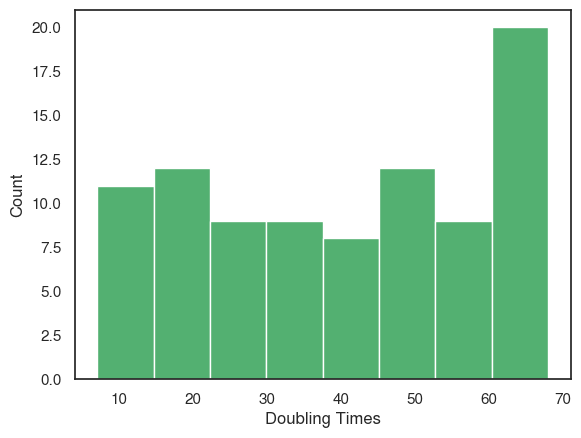

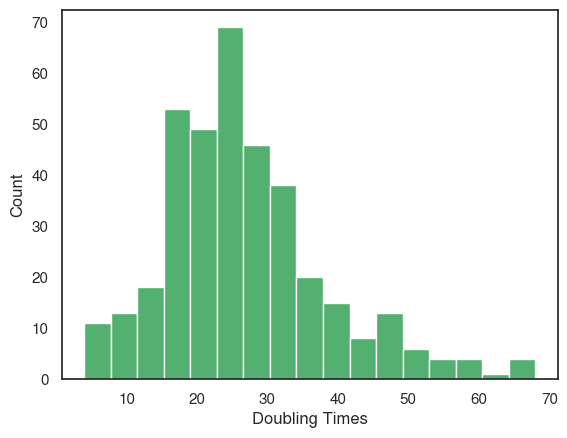

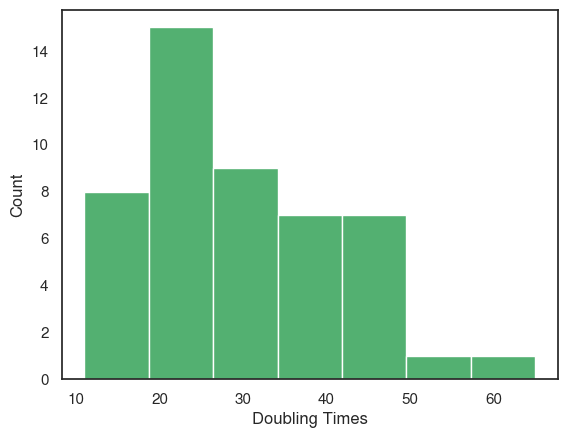

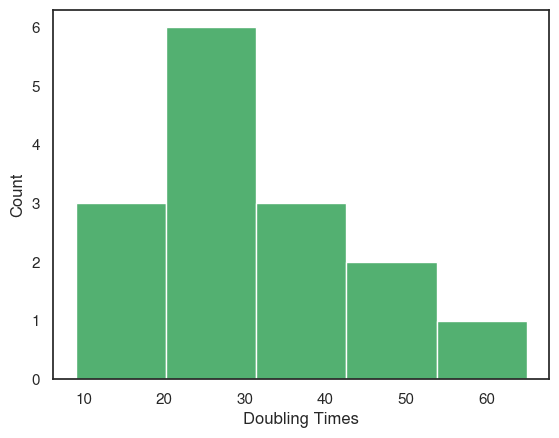

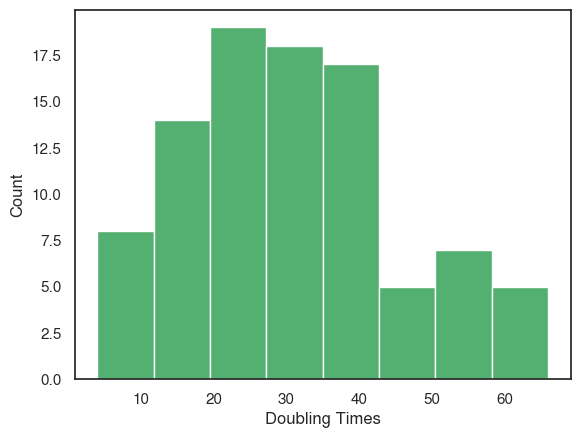

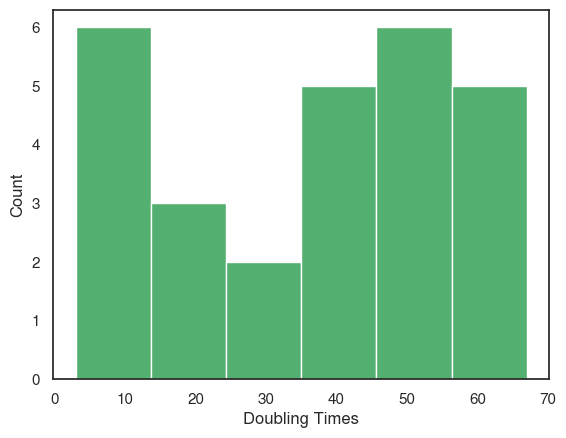

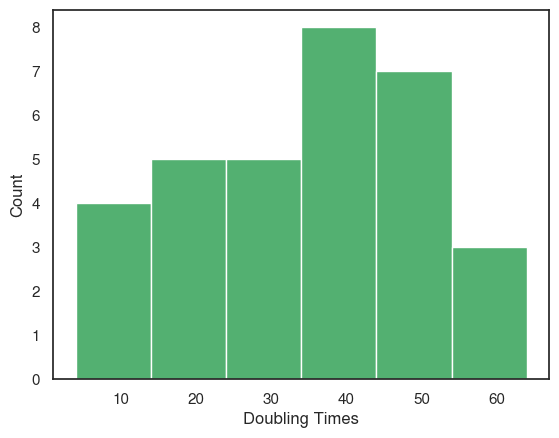

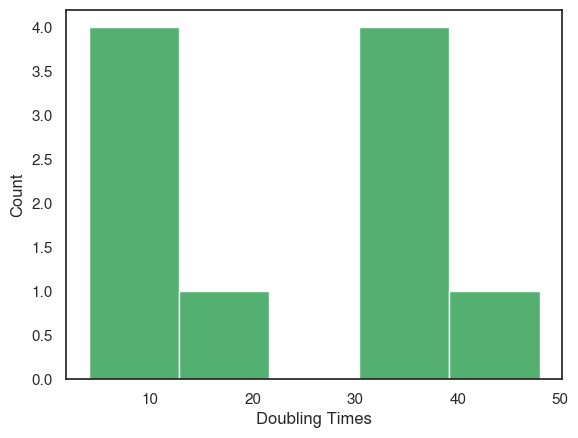

In [604]:
for i in range(0, 8):
    sns.histplot(group_dict[i]['Doubling Times'])
    plt.show()

In [587]:
group_dict[('CTRL', None, 'RD1')]

KeyError: ('CTRL', None, 'RD1')

In [580]:
group

,ID,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,...,Mtb Area Processed (µm),Time Model (hours),Mtb Area Model (µm),mtb_origin,Doubling Amounts,Doubling Times,r2,Growth Category,Mtb Strain or Drug Compound,CTRL Type
101091,1221.4.8.ND0003,9.0,1.989013,-1.989013,3222.089521,-1346.316053,NaN,True,True,373.137665,...,NaN,NaN,NaN,Growth,"[2.4, 4.8]",48.0,0.65,Slow,RIF,None
107005,1238.4.7.ND0003,8.5,11.732943,-4.693177,576.813806,632.796704,NaN,False,True,834.564758,...,NaN,NaN,NaN,Growth,"[2.6, 5.2, 10.4]",4.0,0.59,Fast,RIF,None
107005,1238.4.7.ND0003,8.5,11.732943,-4.693177,576.813806,632.796704,NaN,False,True,834.564758,...,NaN,NaN,NaN,Growth,"[2.6, 5.2, 10.4]",8.0,0.59,Fast,RIF,None
594073,257.5.7.PS0000,58.0,7.330296,24.762096,671.325453,620.393308,True,True,True,170.864822,...,17.253013,58.0,8.721674,Growth,"[5.3, 10.6, 21.2]",37.0,0.62,Slow,RIF,None
594073,257.5.7.PS0000,58.0,7.330296,24.762096,671.325453,620.393308,True,True,True,170.864822,...,17.253013,58.0,8.721674,Growth,"[5.3, 10.6, 21.2]",15.0,0.62,Fast,RIF,None
935297,435.5.7.PS0000,0.0,1.787877,4.804919,528.496431,-233.854307,NaN,False,False,1003.608276,...,NaN,NaN,NaN,Growth,"[1.92, 3.84]",9.0,0.27,Fast,RIF,None
947735,447.6.7.PS0000,56.0,12.112866,3.642799,1459.689819,-1130.899227,True,True,True,749.253052,...,12.112866,56.0,12.271346,Growth,"[3.9, 7.8]",8.0,0.67,Fast,RIF,None
1065285,580.6.7.PS0000,8.0,4.492041,0.938635,783.894656,153.310450,False,False,True,637.467651,...,1.340908,8.0,1.648292,Growth,"[1.92, 3.84]",31.0,0.69,Slow,RIF,None
1097661,620.6.7.PS0000,9.0,23.153007,12.939760,2097.783091,1477.948495,True,True,True,67.064842,...,24.270430,9.0,22.489043,Growth,"[12.5, 25.0]",32.0,0.89,Slow,RIF,None
1225231,825.4.7.ND0002,6.5,7.799613,38.729885,18799.124035,-2021.753623,NaN,True,True,672.344666,...,NaN,NaN,NaN,Growth,"[4.7, 9.4, 18.8]",31.5,0.59,Slow,RIF,None


In [576]:
results_df

,Compound,Group,p_value,Normal Distribution
0,CTRL,"(RD1,)",1.361528e-04,False
1,CTRL,"(WT,)",3.301933e-10,False
2,PZA,"(EC50,)",4.697963e-02,False
3,PZA,"(EC99,)",3.978867e-01,True
4,INH,"(EC50,)",6.411214e-02,True
5,INH,"(EC99,)",7.021453e-02,True
6,RIF,"(EC50,)",5.420324e-01,True
7,RIF,"(EC99,)",1.785700e-01,True


# Which of these doubling times are from uptake? 

# configuring new colormap

Color Group 1:
  - (0.2235294117647059, 0.23137254901960785, 0.4745098039215686, 1.0)
  - (0.4196078431372549, 0.43137254901960786, 0.8117647058823529, 1.0)
Color Group 2:
  - (0.5490196078431373, 0.6352941176470588, 0.3215686274509804, 1.0)
  - (0.5490196078431373, 0.42745098039215684, 0.19215686274509805, 1.0)
Color Group 3:
  - (0.9058823529411765, 0.796078431372549, 0.5803921568627451, 1.0)
  - (0.8392156862745098, 0.3803921568627451, 0.4196078431372549, 1.0)
Color Group 4:
  - (0.6470588235294118, 0.3176470588235294, 0.5803921568627451, 1.0)
  - (0.8705882352941177, 0.6196078431372549, 0.8392156862745098, 1.0)


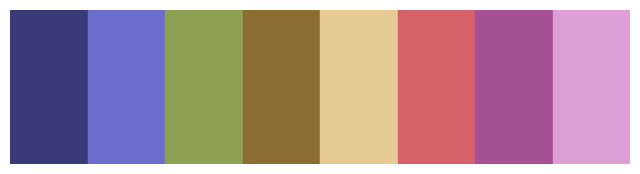

Color 1: #8e0152
Color 2: #f5c4e1
Color 3: #c7e89f
Color 4: #276419


In [61]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import colors as mcolors

# Load the standard PiYG colormap
piyg_cmap = plt.get_cmap('tab20b')

# Define the positions to sample from the colormap
# We want 4 distinct colors, each with 2 shades (light and dark), so 8 positions in total
positions = np.linspace(0, 1, 8)  # Get 8 equally spaced positions from 0 to 1

# Sample colors from the PiYG colormap
colors = [piyg_cmap(pos) for pos in positions]

# Split colors into four groups, each having two shades (light and dark)
color_groups = [colors[i:i + 2] for i in range(0, len(colors), 2)]

# Display the resulting colors
for i, group in enumerate(color_groups):
    print(f"Color Group {i+1}:")
    for shade in group:
        print(f"  - {shade}")

# Plotting the colors for visualization
fig, ax = plt.subplots(figsize=(8, 2))
for i, group in enumerate(color_groups):
    for j, shade in enumerate(group):
        ax.add_patch(plt.Rectangle((i * 2 + j, 0), 1, 1, color=shade))
ax.set_xlim(0, 8)
ax.set_ylim(0, 1)
ax.axis('off')
plt.show()


# Original RGBA tuples
rgba_colors = [
    (0.5568627450980392, 0.00392156862745098, 0.3215686274509804, 1.0),
    (0.9607843137254902, 0.7686274509803921, 0.8823529411764706, 1.0),
    (0.781699346405229, 0.9084967320261439, 0.6222222222222226, 1.0),
    (0.15294117647058825, 0.39215686274509803, 0.09803921568627451, 1.0)
]

# Convert RGBA to hex
hex_colors = [mcolors.to_hex(rgba) for rgba in rgba_colors]

# Print the hex codes
for i, hex_code in enumerate(hex_colors):
    print(f"Color {i+1}: {hex_code}")

In [62]:
super_expiyg = colours.super_expiyg

In [63]:
# # Define color mapping for compounds using vaporwave palette
# vaporwave_color_map = {
#     'PZA': {'EC50': vaporwave[0], 'EC99': vaporwave[1]},  # Light for EC50, Dark for EC99
#     'RIF': {'EC50': vaporwave[2], 'EC99': vaporwave[3]},  # Light for EC50, Dark for EC99
#     'INH': {'EC50': vaporwave[4], 'EC99': vaporwave[5]},  # Light for EC50, Dark for EC99
#     'CTRL': {'wt': vaporwave[7], 'rd1': vaporwave[6]}     # Darker for wt, Lighter for rd1
# }
# # Define color mapping for compounds using vaporwave palette
# super_expiyg_color_map = {
#     'PZA': {'EC50': super_expiyg[3], 'EC99': super_expiyg[2]},  # Light for EC50, Dark for EC99
#     'RIF': {'EC50': super_expiyg[4], 'EC99': super_expiyg[5]},  # Light for EC50, Dark for EC99
#     'INH': {'EC50': super_expiyg[6], 'EC99': super_expiyg[7]},  # Light for EC50, Dark for EC99
#     'CTRL': {'wt': super_expiyg[0], 'rd1': super_expiyg[1]}     # Darker for wt, Lighter for rd1
# }

# Define color mapping for compounds using vaporwave palette
expanded_piyg_color_map = {
    'PZA': {'EC50':  expanded_piyg[4], 'EC99': expanded_piyg[5]},  # Light for EC50, Dark for EC99
    'RIF': {'EC50': expanded_piyg[4], 'EC99': expanded_piyg[5]},  # Light for EC50, Dark for EC99
    'INH': {'EC50':  expanded_piyg[4], 'EC99': expanded_piyg[5]},  # Light for EC50, Dark for EC99
    'CTRL': {'wt': expanded_piyg[0], 'rd1': expanded_piyg[1]}     # Darker for wt, Lighter for rd1
}

piyg_color_map = {
    'PZA': {'EC50': hex_colors[1], 'EC99': hex_colors[0]},  # Light for EC50, Dark for EC99
    'RIF': {'EC50': hex_colors[1], 'EC99': hex_colors[0]},  # Light for EC50, Dark for EC99
    'INH': {'EC50': hex_colors[1], 'EC99': hex_colors[0]},  # Light for EC50, Dark for EC99
    'CTRL': {'wt': hex_colors[3], 'rd1': hex_colors[2]}     # Darker for wt, Lighter for rd1
}

# ARX

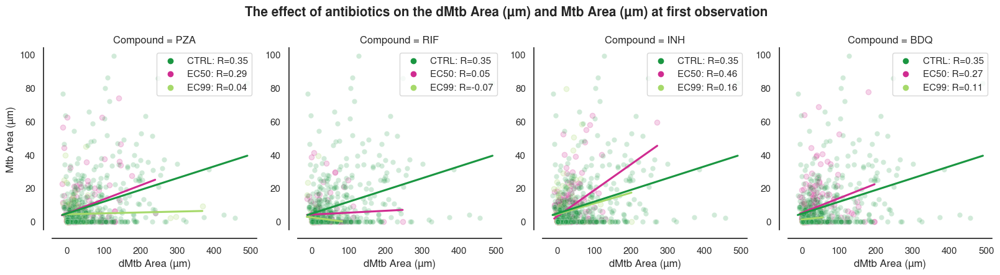

<Figure size 640x480 with 0 Axes>

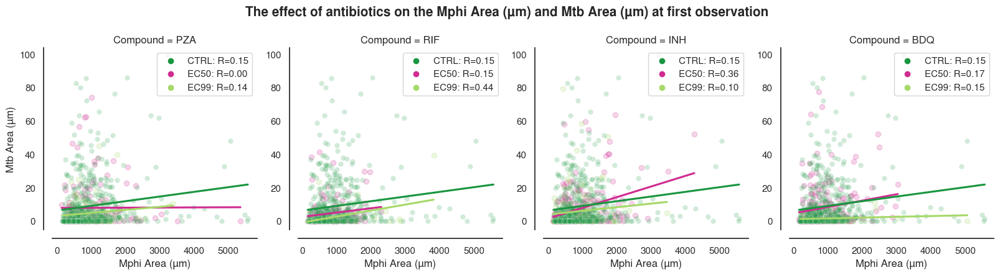

<Figure size 640x480 with 0 Axes>

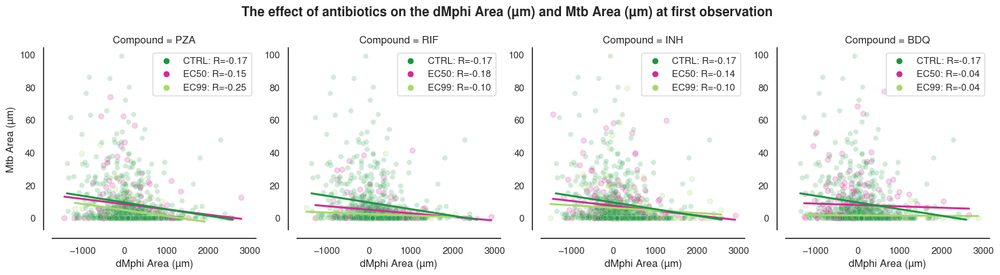

<Figure size 640x480 with 0 Axes>

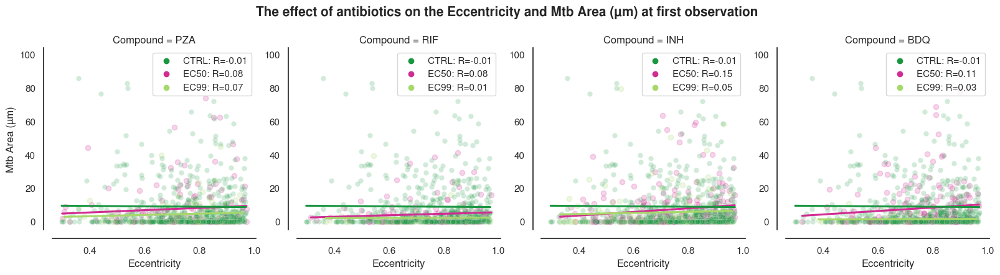

<Figure size 640x480 with 0 Axes>

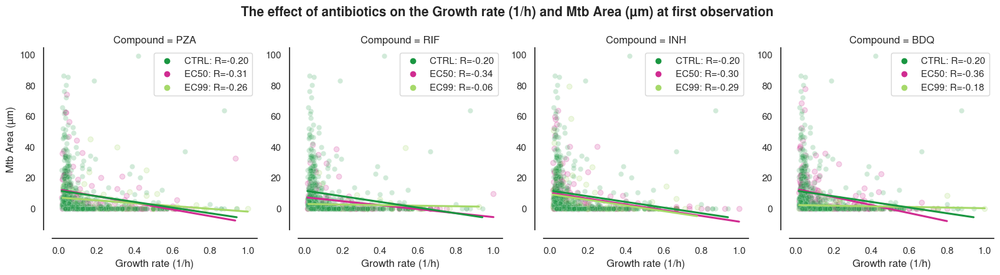

<Figure size 640x480 with 0 Axes>

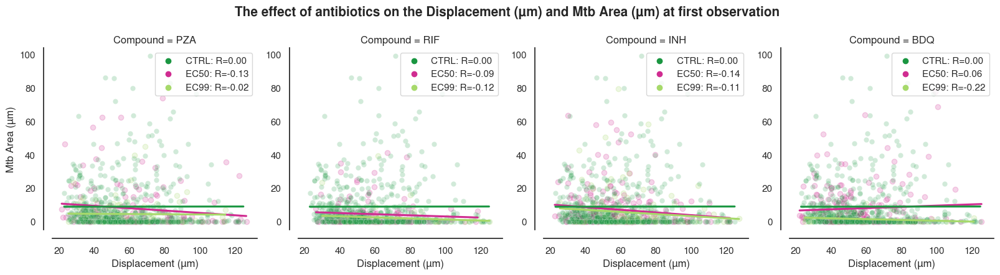

<Figure size 640x480 with 0 Axes>

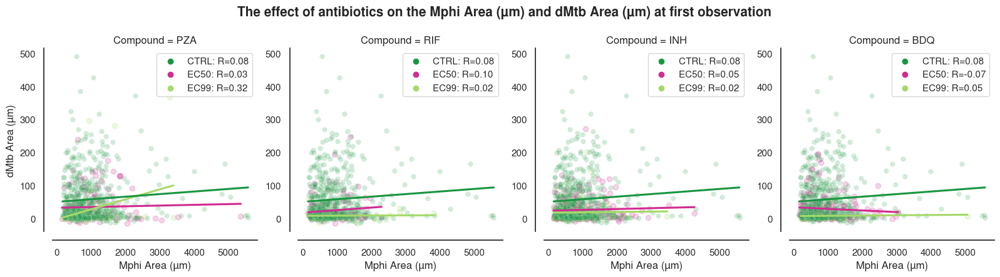

<Figure size 640x480 with 0 Axes>

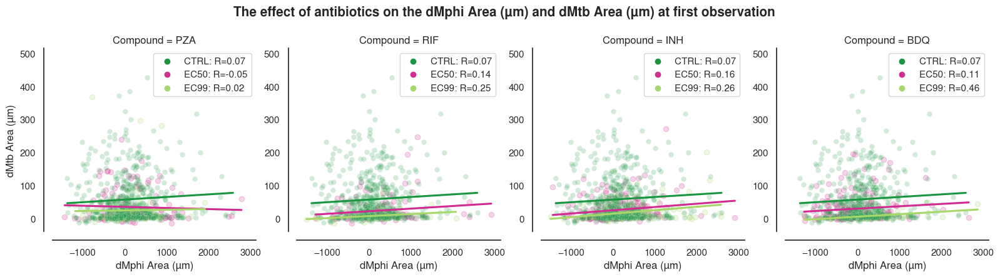

<Figure size 640x480 with 0 Axes>

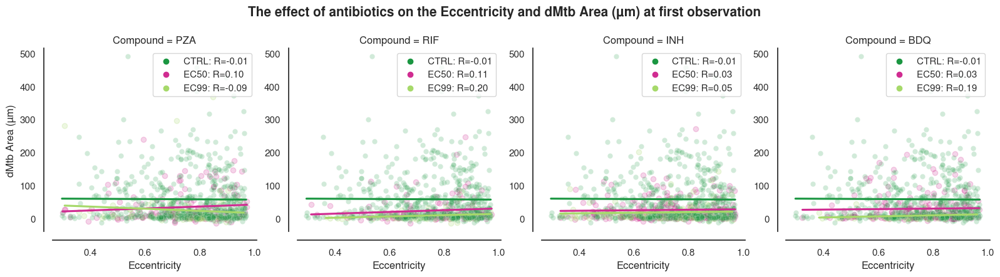

<Figure size 640x480 with 0 Axes>

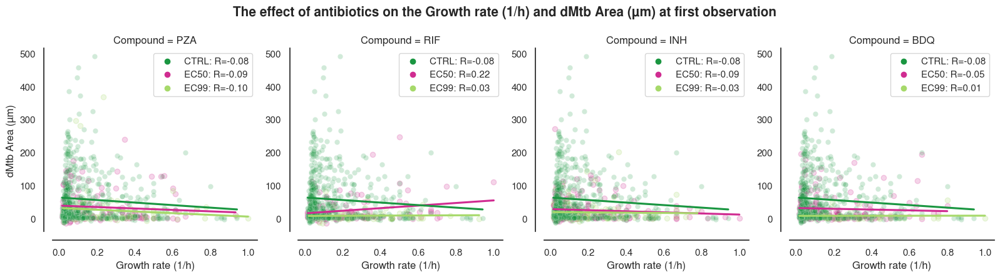

<Figure size 640x480 with 0 Axes>

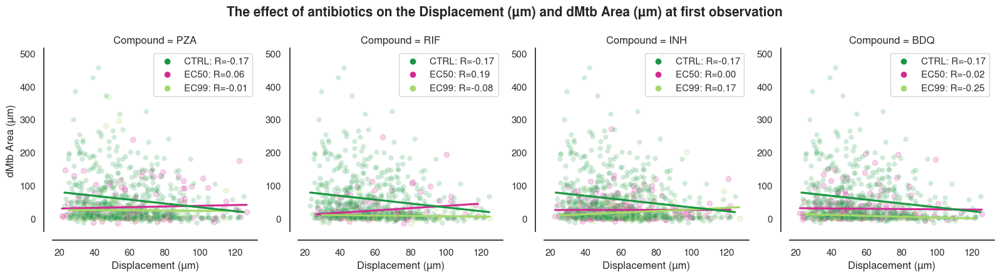

<Figure size 640x480 with 0 Axes>

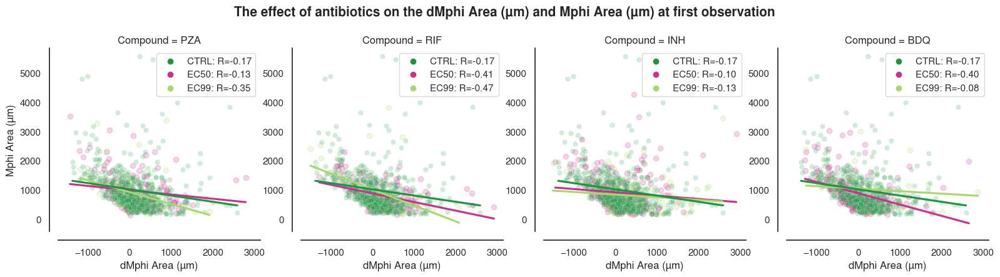

<Figure size 640x480 with 0 Axes>

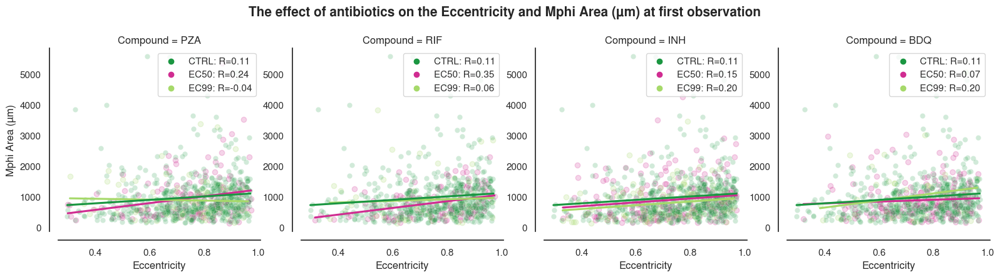

<Figure size 640x480 with 0 Axes>

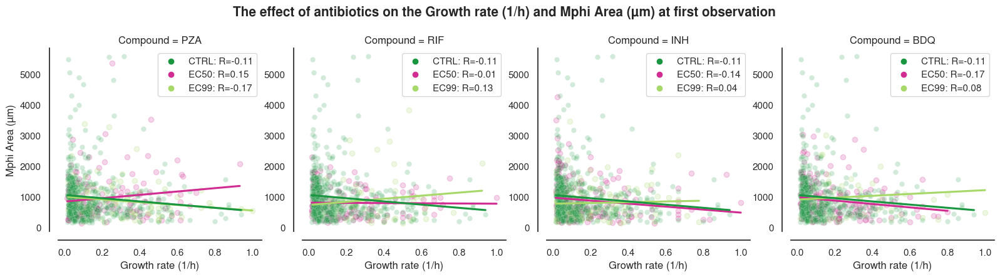

<Figure size 640x480 with 0 Axes>

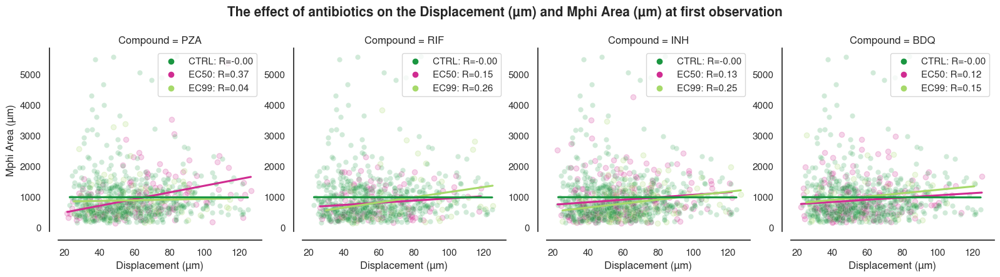

<Figure size 640x480 with 0 Axes>

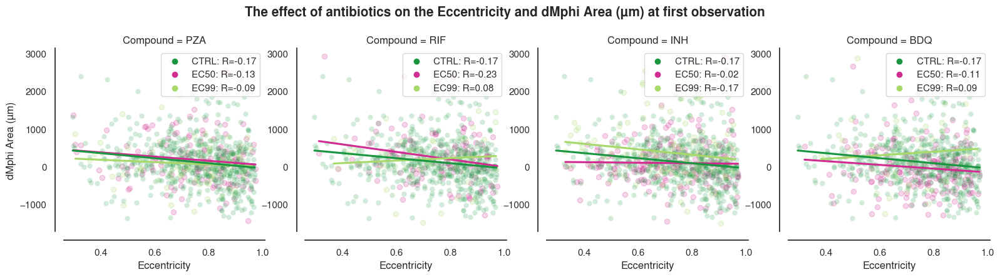

<Figure size 640x480 with 0 Axes>

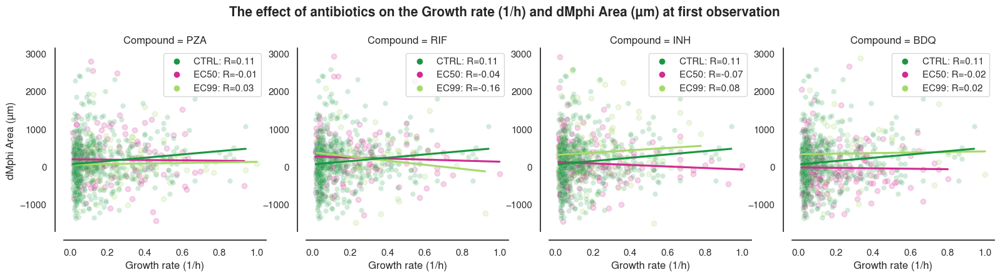

<Figure size 640x480 with 0 Axes>

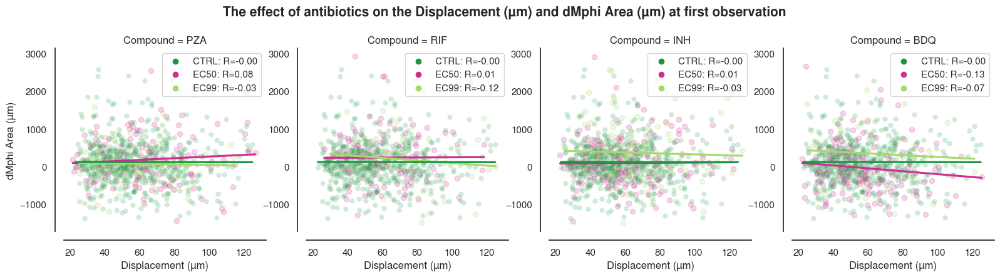

<Figure size 640x480 with 0 Axes>

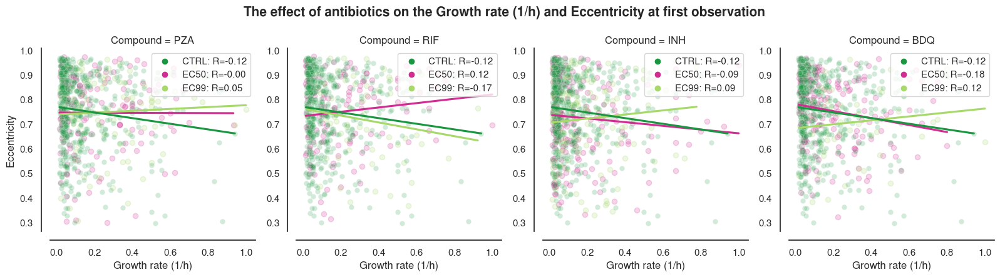

<Figure size 640x480 with 0 Axes>

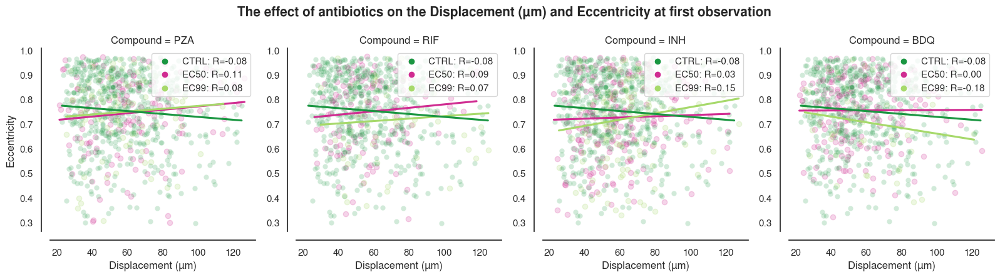

<Figure size 640x480 with 0 Axes>

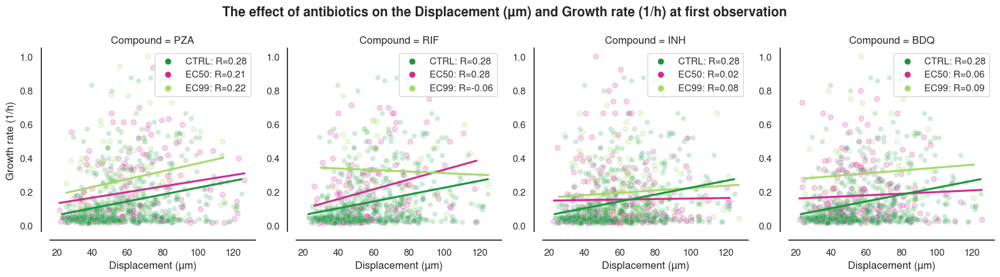

<Figure size 640x480 with 0 Axes>

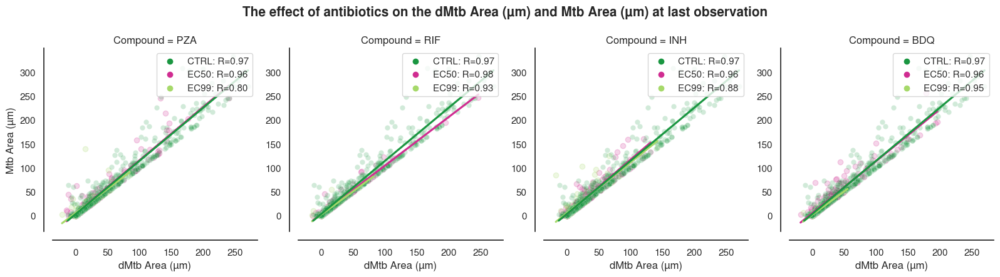

<Figure size 640x480 with 0 Axes>

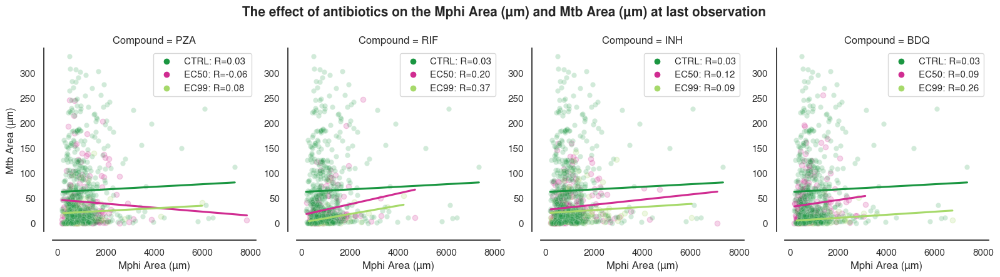

<Figure size 640x480 with 0 Axes>

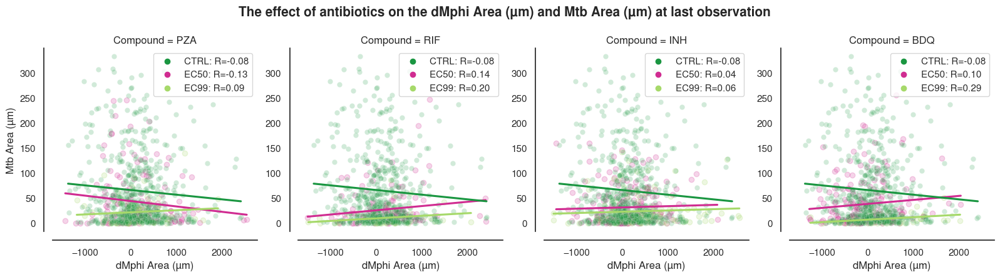

<Figure size 640x480 with 0 Axes>

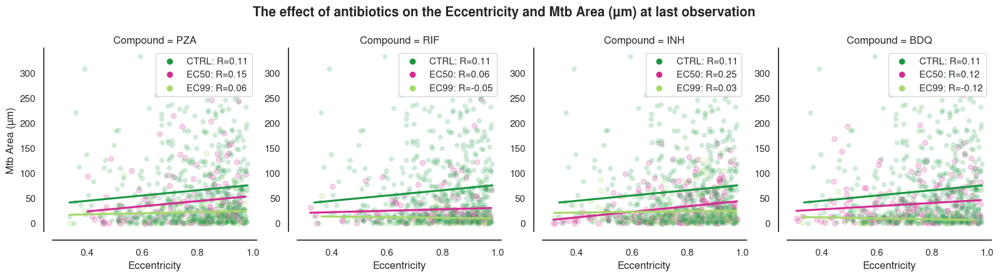

<Figure size 640x480 with 0 Axes>

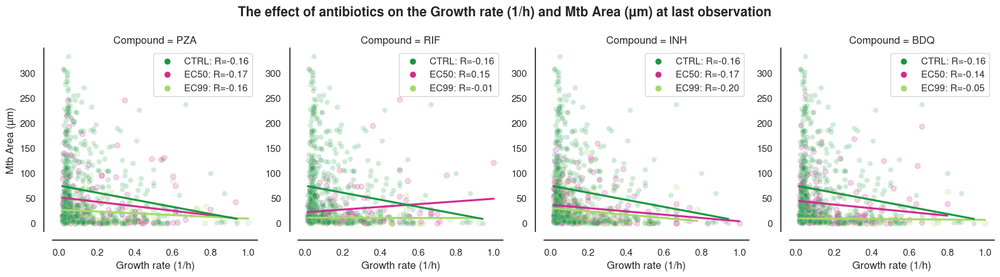

<Figure size 640x480 with 0 Axes>

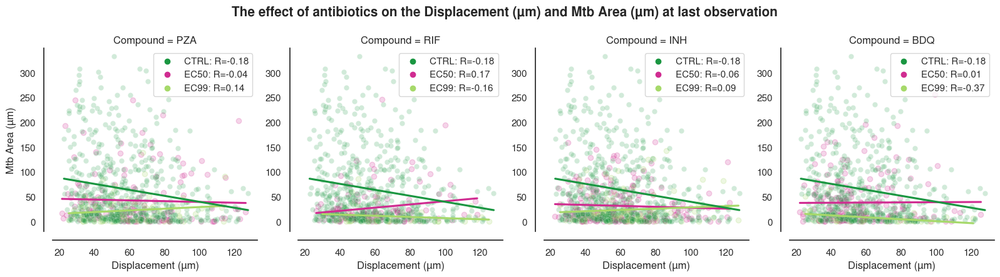

<Figure size 640x480 with 0 Axes>

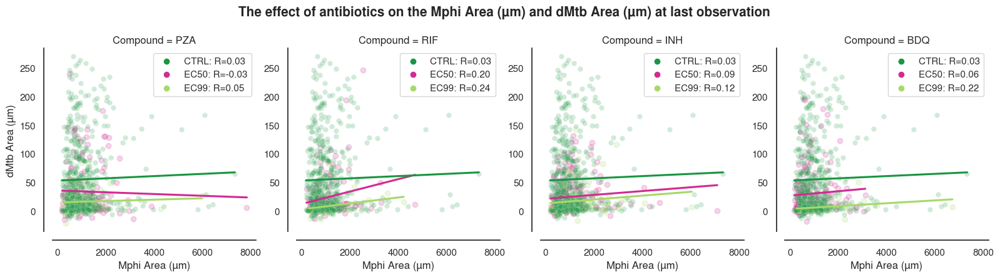

<Figure size 640x480 with 0 Axes>

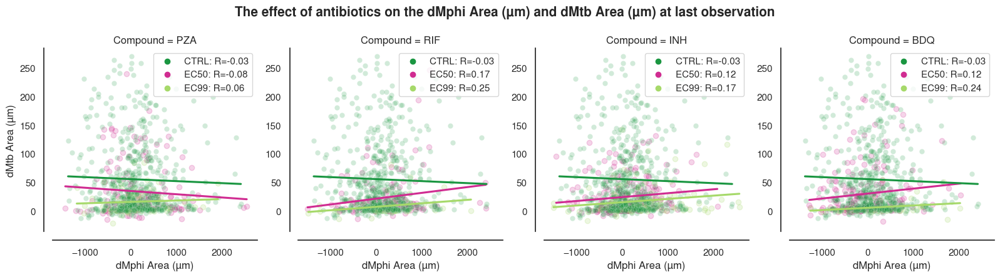

<Figure size 640x480 with 0 Axes>

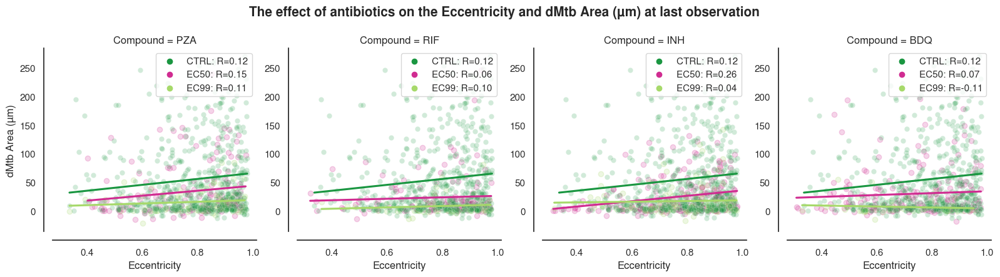

<Figure size 640x480 with 0 Axes>

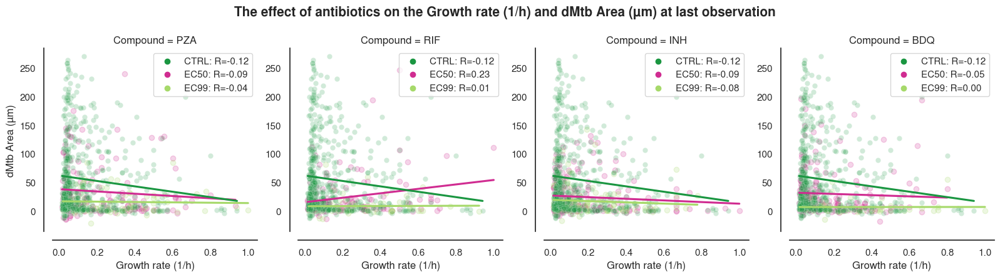

<Figure size 640x480 with 0 Axes>

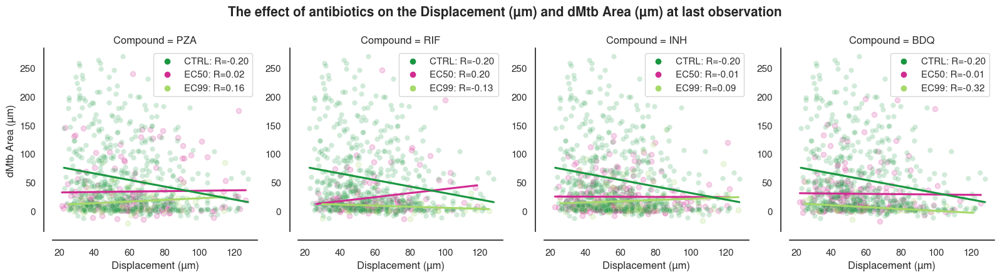

<Figure size 640x480 with 0 Axes>

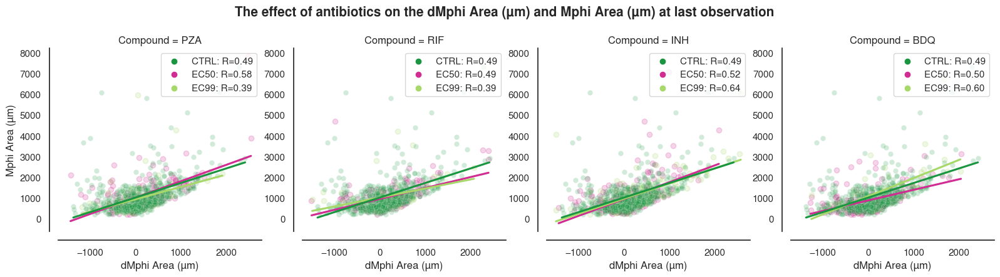

<Figure size 640x480 with 0 Axes>

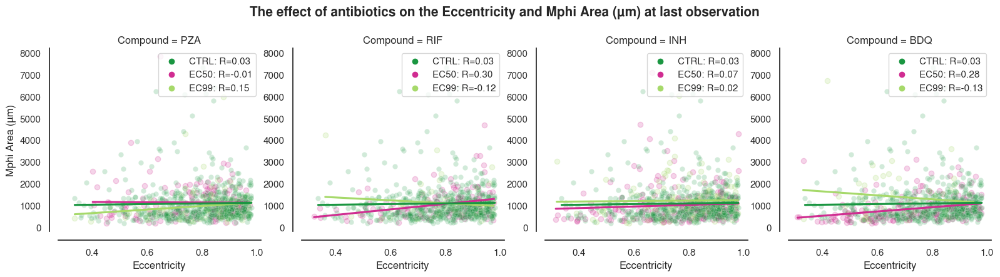

<Figure size 640x480 with 0 Axes>

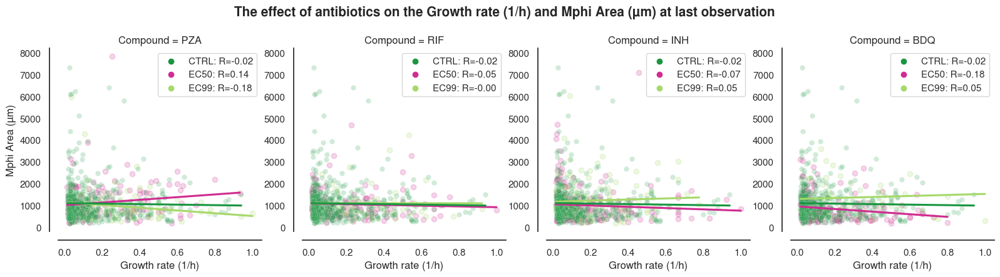

<Figure size 640x480 with 0 Axes>

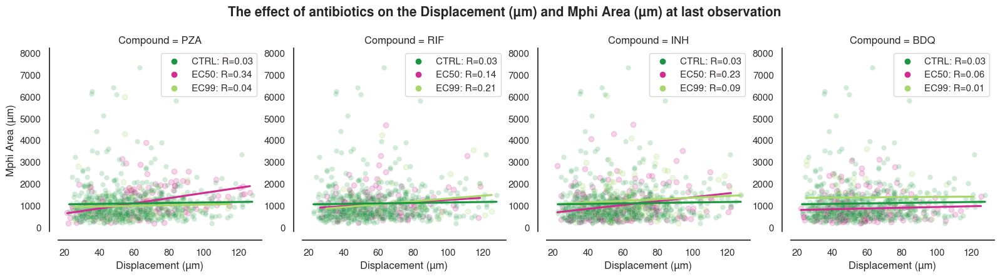

<Figure size 640x480 with 0 Axes>

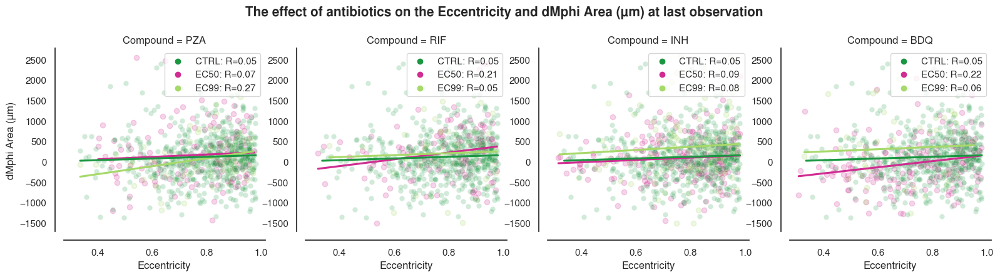

<Figure size 640x480 with 0 Axes>

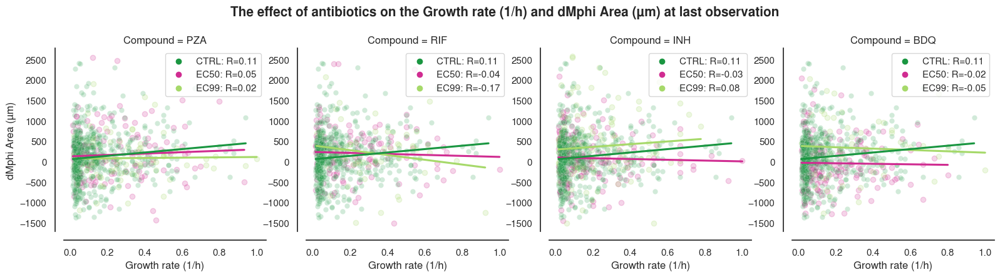

<Figure size 640x480 with 0 Axes>

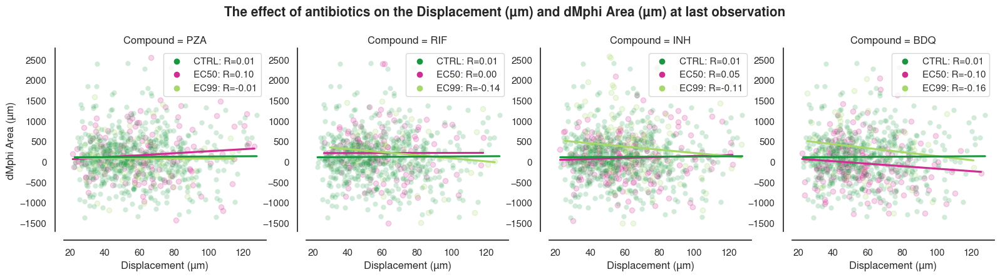

<Figure size 640x480 with 0 Axes>

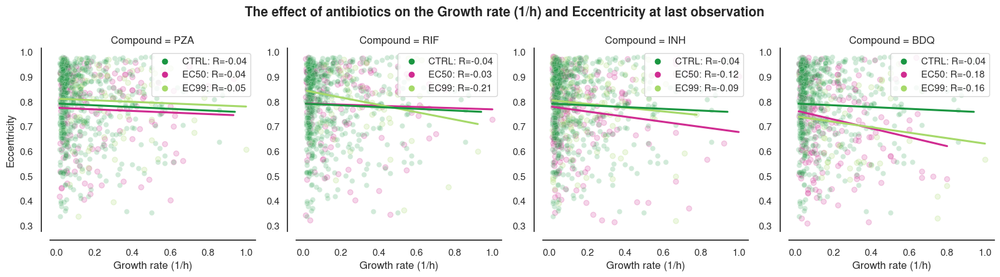

<Figure size 640x480 with 0 Axes>

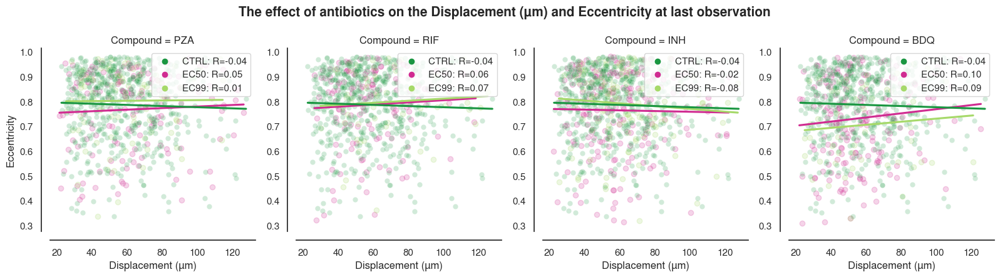

<Figure size 640x480 with 0 Axes>

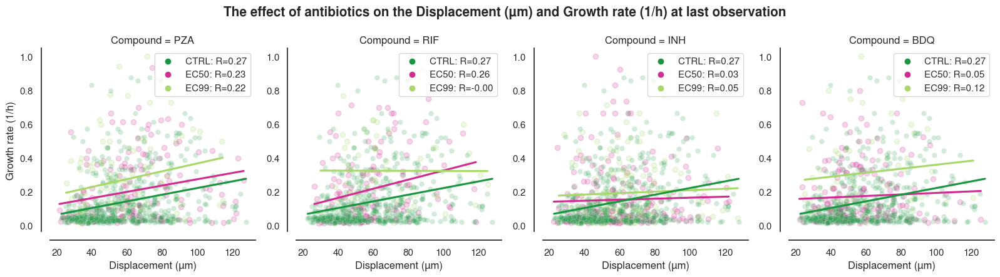

<Figure size 640x480 with 0 Axes>

In [612]:
for when in whens:

    # Subset your data and remove duplicates based on Unique_ID
    subset_df = df[(df['r2'] > 0.7) & (df['r2'] < 1) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')].drop_duplicates(subset=['ID'], keep=when)
    
    # Convert all relevant columns to numeric, coercing errors to NaN
    for col in variables:
        subset_df[col] = pd.to_numeric(subset_df[col], errors='coerce')
    
    # Drop rows with NaNs in the relevant columns
    subset_df = subset_df.dropna(subset=variables)
    
    # Calculate the IQR for each variable and filter the data
    for col in variables:
        Q1 = subset_df[col].quantile(0.01)
        Q3 = subset_df[col].quantile(0.99)
        IQR = Q3 - Q1
        subset_df = subset_df[(subset_df[col] >= Q1) & (subset_df[col] <= Q3)]
    
    iqr_filtered_df = subset_df

    # Separate control data
    control_data = iqr_filtered_df[iqr_filtered_df['Compound'] == 'CTRL']
    iqr_filtered_df = iqr_filtered_df[iqr_filtered_df['Compound'] != 'CTRL']  # Exclude control data from the main data
    
    # Loop through all combinations of y_var and x_var
    plotted_pairs = set()
    for y_var in variables:
        for x_var in variables:
            if x_var != y_var and (y_var, x_var) not in plotted_pairs and (x_var, y_var) not in plotted_pairs:
                if 'Growth rate (1/h)' in [x_var, y_var]:
                    x_var, y_var = ('Growth rate (1/h)', y_var) if x_var == 'Growth rate (1/h)' else (x_var, 'Growth rate (1/h)')
                
                plotted_pairs.add((x_var, y_var))
                
                # Create the FacetGrid without the control data
                g = sns.FacetGrid(iqr_filtered_df, 
                                  col="Compound", 
                                  hue="Concentration", 
                                  palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]], 
                                  hue_order=hue_order, 
                                  aspect=1, height=4, col_wrap=4)
    
                # Map the scatterplot for each compound with a line of best fit
                g.map_dataframe(sns.regplot, x=x_var, y=y_var, ci=None, scatter_kws={'alpha':0.2})
    
                # Add the control data to each subplot and include line of best fit and R score for control
                for ax in g.axes.flat:
                    sns.scatterplot(x=x_var, y=y_var, data=control_data, color=expanded_piyg[0], ax=ax, label='CTRL', alpha=0.2)
                    sns.regplot(x=x_var, y=y_var, data=control_data, ax=ax, scatter=False, color=expanded_piyg[0], ci=None)
    
                x_ctrl = control_data[x_var]
                y_ctrl = control_data[y_var]
                corr_ctrl, _ = pearsonr(x_ctrl, y_ctrl)
    
                # Calculate and annotate correlation coefficients on each subplot
                for ax in g.axes.flat:
                    compound = ax.get_title().replace('Compound = ', '')
                    annotations = []
                    handles, labels = [], []
                    # Add the handle and label for the control data first
                    handles.append(ax.scatter([], [], label='CTRL', color=expanded_piyg[0]))
                    labels.append(f'CTRL: R={corr_ctrl:.2f}')
                    for concentration in hue_order:
                        positions = iqr_filtered_df[(iqr_filtered_df['Compound'] == compound) & (iqr_filtered_df['Concentration'] == concentration)]
                        if not positions.empty:
                            x = positions[x_var]
                            y = positions[y_var]
                            corr, _ = pearsonr(x, y)
                            corr_text = f'{concentration}: R={corr:.2f}'
                            annotations.append(corr_text)
                            # Add the handle and label for the legend
                            color_index = hue_order.index(concentration)
                            handle = ax.scatter([], [], label=corr_text, color=[expanded_piyg[-1], expanded_piyg[2], expanded_piyg[1]][color_index])
                            handles.append(handle)
                            labels.append(corr_text)
    
                    # Create a custom legend for each subplot including the control
                    ax.legend(handles=handles, labels=labels, frameon=True, loc='upper right')
    
                # Add axis labels and title
                g.set_axis_labels(x_var, y_var)
                g.fig.subplots_adjust(top=0.9, wspace=0.2)  # Adjust wspace to add lateral padding
                
                for ax in g.axes.flat:
                    sns.despine(ax=ax, offset = 10)                
                
                g.fig.suptitle(f'The effect of antibiotics on the {x_var} and {y_var} at {when} observation', fontsize=15, fontweight='bold', y=1.07)
    
                # Format the filename to replace special characters
                x_var_filename = x_var.replace(' ', '_').replace('(', '').replace(')', '').replace('µ', 'u')
                y_var_filename = y_var.replace(' ', '_').replace('(', '').replace(')', '').replace('µ', 'u')
                if '1/h' in y_var_filename:
                    y_var_filename = y_var_filename.replace('1/h','1-h')
                if '1/h' in x_var_filename:
                    x_var_filename = x_var_filename.replace('1/h','1-h')
                    
                plt.savefig(os.path.join(output_dir, f'ATB_effect_IQR_{x_var_filename}_vs_{y_var_filename}_t{when}.png'), bbox_inches='tight', dpi=314)
                plt.show()
                plt.clf()

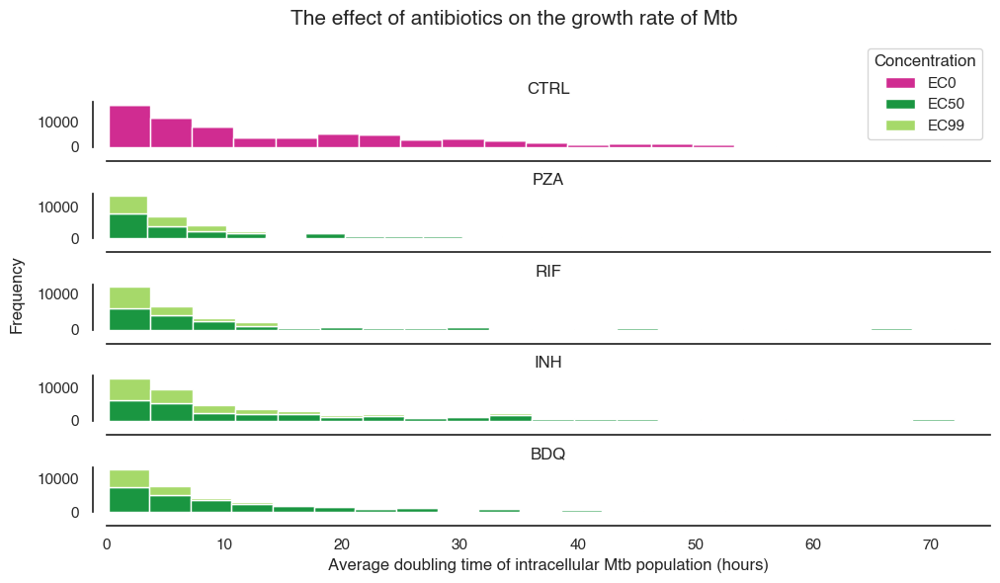

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Your existing DataFrame after filtering
subset_df = df[(df['r2'] > 0.5) & (df['dt'] > 0) & (df['Strain/Compound'] != 'RD1')]

# Define the palette
palette = [expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]]  # Make sure these colors are defined

# Unique compounds and concentrations
compounds = subset_df['Compound'].unique()
concentrations = subset_df['Concentration'].unique()

# Set up the plot
fig, axes = plt.subplots(len(compounds), 1, figsize=(10, 6), sharex=True)  # Use fig, axes for subplot management
if len(compounds) == 1:  # Handle case where there's only one compound
    axes = [axes]

for i, (ax, compound) in enumerate(zip(axes, compounds)):
    data = [subset_df[(subset_df['Compound'] == compound) & (subset_df['Concentration'] == conc)]['dt'].dropna() for conc in concentrations]
    ax.hist(data, bins=20, stacked=True, label=concentrations, color=palette)
    ax.set_title(compound)
    if i == 0:
        ax.legend(title='Concentration')
    if i < len(compounds) - 1:
        ax.set_xticklabels([])  # Hide x ticks for all but the last subplot
    else:
        ax.set_xticks(np.arange(0, 80, 10))  # Set specific x-ticks for the last plot if necessary
        ax.set_xticklabels(np.arange(0, 80, 10))  # Ensure labels are visible

fig.text(-0.01, 0.5, 'Frequency', va='center', rotation='vertical', fontsize=12)  # Add a common y-axis label
plt.xlabel("Average doubling time of intracellular Mtb population (hours)")
plt.suptitle('The effect of antibiotics on the growth rate of Mtb', fontsize=15, fontweight='bold')
sns.despine(offset=10)
fig.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for suptitle
plt.xlim(0, 75)  # Set the limits for the x-axis if necessary
plt.savefig(os.path.join(output_dir, 'ATB_effect_hist_dt_gt0.png'), bbox_inches='tight', dpi=314)
plt.show()

In [8]:
# df['dMtb'] = df['delta Mtb max fold-change normalised max area']
df['Mtb'] = df['Mtb Area'] #df['Intracellular thresholded Mtb content smooth']

In [23]:
unique_ID = '85.4.5'
sc_df = df.loc[unique_ID]
sc_df

,Time (hours),Mtb Area,dMtb,Strain,Compound,Concentration,Unique ID,Acquisition ID,Cell ID,Mphi Area,...,Strain/Compound,dMtb/dt,%dMtb/dt,%dMtb,Mean Mtb Intensity,Thresholded Mean Mtb Intensity,Infection Status,Initial Infection Status,Final Infection Status,Rolling Avg dMtb/dt
281595,0,2675.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,46764.0,...,CTRL,0.0,0.000000,201.271028,443.901398,127.701759,True,True,True,0.104293
281596,1,2376.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,62884.0,...,CTRL,-299.0,-11.177570,201.271028,402.362885,75.280693,True,True,True,-20.000379
281597,2,2276.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,67435.0,...,CTRL,-100.0,-4.208754,201.271028,390.603058,62.043819,True,True,True,-26.695353
281598,3,2608.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,48134.0,...,CTRL,332.0,14.586995,201.271028,428.111389,112.511589,True,True,True,-4.615656
281599,4,2398.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,60039.0,...,CTRL,-210.0,-8.052147,201.271028,403.103180,79.544876,True,True,True,-18.585858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281665,70,9059.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,14227.0,...,CTRL,155.0,1.740791,201.271028,2083.896240,1993.407959,True,True,True,68.266667
281666,71,8928.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,13664.0,...,CTRL,-131.0,-1.446076,201.271028,2144.229248,2056.757812,True,True,True,49.000000
281667,72,8303.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,12339.0,...,CTRL,-625.0,-7.000448,201.271028,2249.445312,2164.719971,True,True,True,4.333333
281668,73,6219.0,5384.0,WT,CTRL,EC0,85.4.5,"(4, 5)",85,9494.0,...,CTRL,-2084.0,-25.099362,201.271028,2205.718750,2113.622314,True,True,True,-149.933333


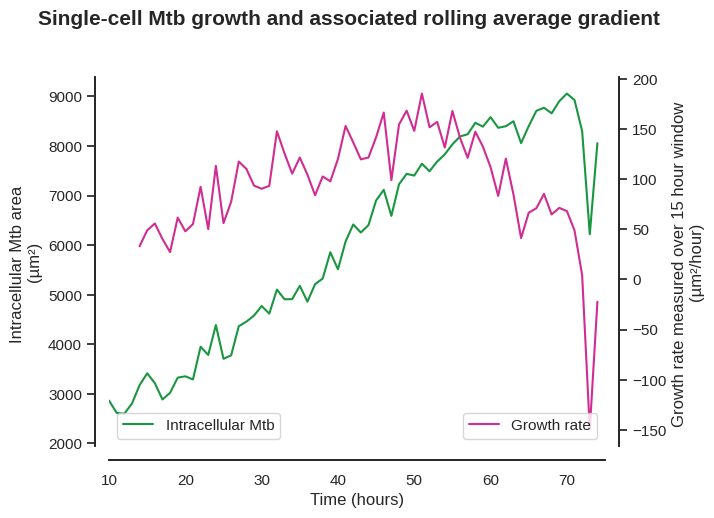

In [27]:

# Calculate the rolling average of 'dMtb/dt' over a specified window (e.g., 15)
window_size = 15
sc_df['Rolling Avg dMtb/dt'] = sc_df['dMtb/dt'].rolling(window=window_size).mean()

# Create the first plot
ax1 = sns.lineplot(x='Time (hours)', y='Mtb Area', data=sc_df, color=expanded_piyg[0], label='Intracellular Mtb')
plt.legend(loc='lower left')
ax1.set_ylabel('Intracellular Mtb area \n(µm\u00b2)')

# Create a second y-axis
ax2 = ax1.twinx()

# Plot the rolling average on the second y-axis
sns.lineplot(x='Time (hours)', y='Rolling Avg dMtb/dt', data=sc_df, ax=ax2, color=expanded_piyg[-1], label='Growth rate')  # Adjust color as needed

# Set the y-axis label for the second y-axis
ax2.set_ylabel(f'Growth rate measured over {window_size} hour window \n(µm\u00b2/hour)')
plt.legend(loc='lower right')

# Adjust plot appearance
sns.despine(offset=10, top=True, right=False)
plt.xlim(10, 75)  # Adjust as per your data

# Set the x-axis label and title for the plot
ax1.set_xlabel('Time (hours)')
plt.gcf().suptitle('Single-cell Mtb growth and associated rolling average gradient', 
                   fontsize=15, fontweight='bold', y=1.02)

plt.show()

### Is this max gradient correlated to antibiotic condition?

In [67]:
unique_ids = df['Unique ID'].unique()
len(unique_ids)

3988

In [73]:
unique_ids = df['Unique ID'].unique()
rolling_means = pd.Series(index=df.index)  # Initialize a Series to store the rolling means
max_rolling_means = {}
window_size = 15  # Define your window size

for cell_id in tqdm(unique_ids, total = len(unique_ids)):
    # Filter the DataFrame for the current cell ID
    cell_data = df[df['Unique ID'] == cell_id]

    # Calculate the rolling mean for this cell
    rolling_mean = cell_data['dMtb/dt'].rolling(window=window_size).mean()

    # Store the results in the rolling_means Series
    rolling_means[cell_data.index] = rolling_mean

    # Store the maximum rolling mean for this cell ID
    max_rolling_means[cell_id] = rolling_mean.max()

# Assign the rolling means back to the DataFrame
df[f'dMtb/dt,T={window_size}'] = rolling_means

# Create a new column for the maximum rolling mean per unique ID
df['Max Rolling Mean'] = df['Unique ID'].map(max_rolling_means)

  0%|          | 0/3988 [00:00<?, ?it/s]

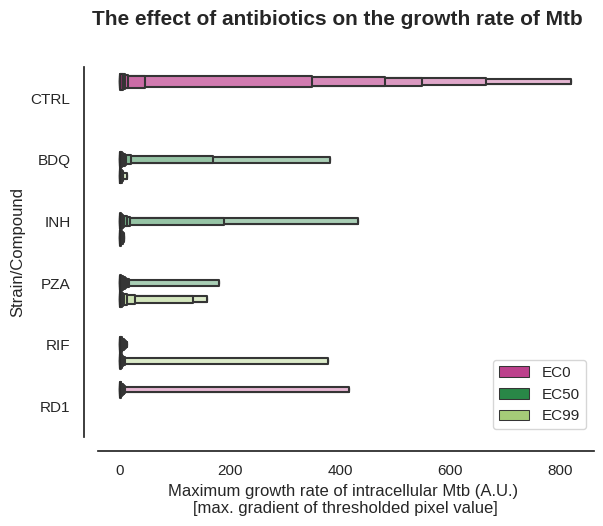

In [79]:
df
g = sns.boxenplot(x="Max. dMtb/dt", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Maximum growth rate of intracellular Mtb (A.U.) \n[max. gradient of thresholded pixel value]")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
# plt.savefig(os.path.join(output_dir, 'ATB_effect_max_growth_rate.png'), bbox_inches = 'tight', dpi = 314)

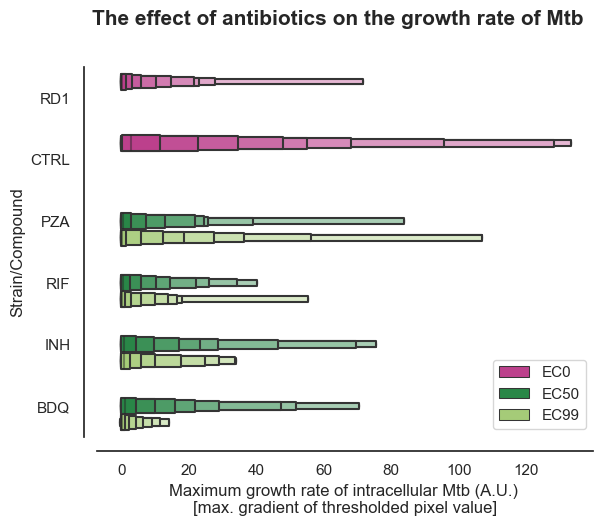

In [163]:
g = sns.boxenplot(x="Max. dMtb gradient", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Maximum growth rate of intracellular Mtb (A.U.) \n[max. gradient of thresholded pixel value]")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
plt.savefig(os.path.join(output_dir, 'ATB_effect_max_growth_rate.png'), bbox_inches = 'tight', dpi = 314)

In [92]:
help(sns.boxenplot)

Help on function boxenplot in module seaborn.categorical:

boxenplot(data=None, *, x=None, y=None, hue=None, order=None, hue_order=None, orient=None, color=None, palette=None, saturation=0.75, width=0.8, dodge=True, k_depth='tukey', linewidth=None, scale='exponential', outlier_prop=0.007, trust_alpha=0.05, showfliers=True, ax=None, box_kws=None, flier_kws=None, line_kws=None)
    Draw an enhanced box plot for larger datasets.
    
    This style of plot was originally named a "letter value" plot because it
    shows a large number of quantiles that are defined as "letter values".  It
    is similar to a box plot in plotting a nonparametric representation of a
    distribution in which all features correspond to actual observations. By
    plotting more quantiles, it provides more information about the shape of
    the distribution, particularly in the tails. For a more extensive
    explanation, you can read the paper that introduced the plot:
    https://vita.had.co.nz/papers/letter-v

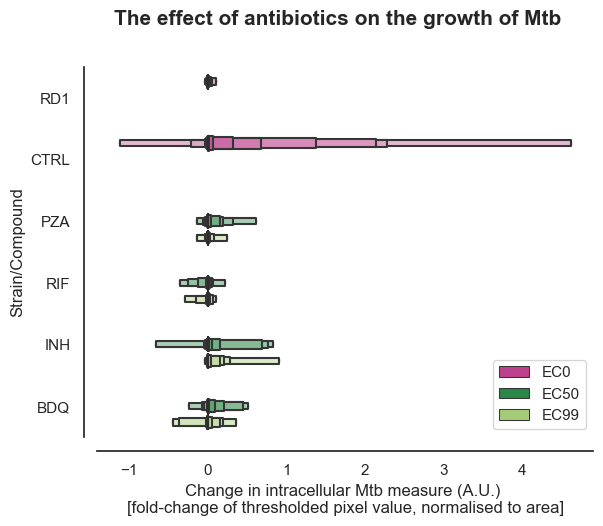

In [164]:
sns.boxenplot(x="dMtb", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale='linear'
              )  
sns.despine(offset = 10)
# plt.xlim(0,5)
plt.xlabel("Change in intracellular Mtb measure (A.U.) \n[fold-change of thresholded pixel value, normalised to area]")
plt.gcf().suptitle('The effect of antibiotics on the growth of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
plt.savefig(os.path.join(output_dir, 'dMtb_boxenplot.png'), bbox_inches = 'tight', dpi = 314)

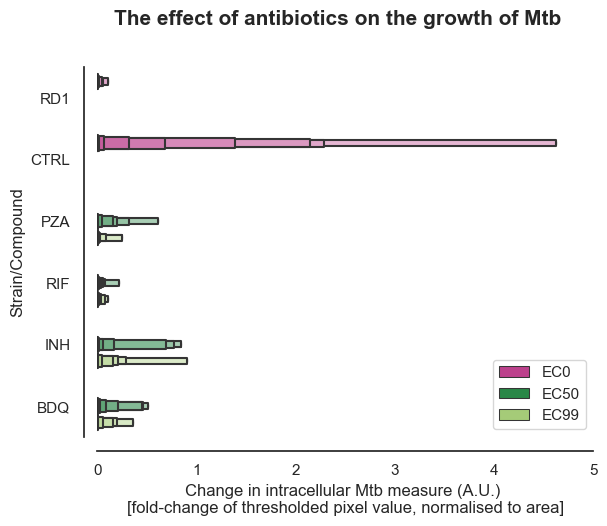

In [165]:
sns.boxenplot(x="dMtb", y="Strain/Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=df, 
            scale='linear'
              )  
sns.despine(offset = 10)
plt.xlim(0,5)
plt.xlabel("Change in intracellular Mtb measure (A.U.) \n[fold-change of thresholded pixel value, normalised to area]")
plt.gcf().suptitle('The effect of antibiotics on the growth of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'lower right')
plt.savefig(os.path.join(output_dir, '+dMtb_boxenplot.png'), bbox_inches = 'tight', dpi = 314)

In [ ]:
for acq_ID in df['Acquisition ID'].unique():
    subset_df = [df['Acquisition ID'] == acq_ID]
    mean_max_dMtb_gradient = np.mean 

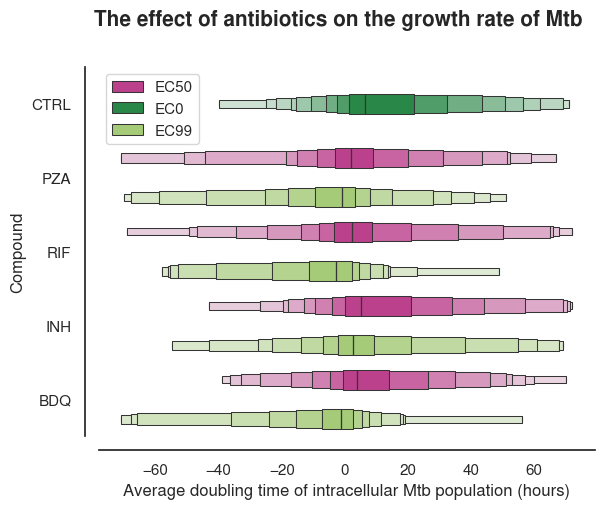

In [9]:
subset_df = df[(df['r2']>0.5) & (df['Strain/Compound'] != 'RD1')]

g = sns.boxenplot(x="dt", y="Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=subset_df,
            hue_order=hue_order,
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Average doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'upper left')
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt.png'), bbox_inches = 'tight', dpi = 314)

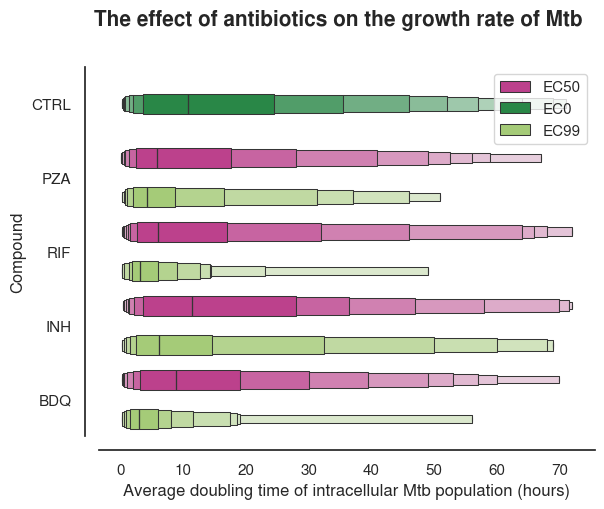

In [10]:
subset_df = df[(df['r2']>0.5) & (df['dt']>0) & (df['Strain/Compound'] != 'RD1')]

g = sns.boxenplot(x="dt", y="Compound",
            hue="Concentration", 
            palette=[expanded_piyg[-1], expanded_piyg[0], expanded_piyg[1]],
            data=subset_df, 
            hue_order=hue_order,
            scale = 'linear'
              )  
sns.despine(offset = 10)
plt.xlabel("Average doubling time of intracellular Mtb population (hours)")
plt.gcf().suptitle('The effect of antibiotics on the growth rate of Mtb', 
                   fontsize=15, fontweight='bold', 
                  y = 1.0)
sns.despine(offset=10)
plt.legend(loc = 'upper right')
plt.savefig(os.path.join(output_dir, 'ATB_effect_dt_gt0.png'), bbox_inches = 'tight', dpi = 314)